### "The ideal outcome of this master project is to generate a robust classification tool using XAI methods that can be applied to adress fundamental questions about autophagy." 

From project plan, Fall 2022

Since already a lot of work has been done on testing different methods for segmentation and classification on the CELLULAR datset, we will try to build on those results (by perhaps choosing one or a few of the described methods) and then instead focus more on the bio part. We will work on the following topics:

- Scrutinize the dataset to understand how the GT classification was performed and to disqualify any erroneous data (resulting from double masks, masks without complete cells, visual effects from merging into jpgs, or just simple mistakes). Since the GT classification was performed on the merged color images, and we want to use the tiff images, the model will not have access to the same data as the human expert. So it would be good to be aware of any adjustments that may have helped (or disturbed) the classification.

- Cell segmentation: Is there a way to not penalize the model for having more cells than GT? Quite some cells have been skipped when making GT masks, which could impact the way the model predicts. Also, there may be a trade-off between getting the correct number of cells and getting their full size. When playing around with Segment Anything by Meta, some made-up cells started to pop up when trying to tune it such that the full cell area was included in the masks. 

- Classification: Is there anything more nuanced that we could use to supplement the yes/no categorization in terms of autophagy activation? There seem to be such a great range between the cells where GFP and RFP intensities overlap fully and the cells with many RFP-only spots. Of course the GT is binary (or ternary if we consider the unknown cells) so a classification model would need to have the same categories, but perhaps other metric could be used to further describe the level of autophagy in each cell. For example: perform further segmentation of puncta inside each cell, and evaluate the chance that the puncta/spot is an autolysosome by considering the intensity relationship between the green and red channel (puncta counting). 

- Explainable methods: Is there anything to consider before we have a classification model to look at? Perhaps some models are easier/harder to combine with explainable methods? And are there any part of the cell that we are specially interested in studying? For example, if we exclude the puncta from images, could we detect other changes in the cell associated with autophagy activation?

- Bio application: Once we have a well working tool, what would be biological questions to look into? Or perhaps the other way around, are there any bio questions that we could tailor the model to?

The rest of this notebook contains some thoughts and questions around the dataset that we could use for discussion. But first a disclaimer: This notebook is only meant as a 'scetchbook' containing ideas and questions rather than anything to necessarily be used further in the project. It is my way of getting to know the dataset :) The functions used in the notebook are hidden but double click on the cell if you want to see how the images have been processed.

In [2]:
# Functions used in this notebook. I left them here so that you can see how the image are processed before plotting

%matplotlib inline
import numpy as np
from IPython import embed
import matplotlib.colors as colors
from PIL import Image
import tifffile
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from matplotlib.colors import LinearSegmentedColormap
from functions import *
import os

def tiff_to_array(tiff_path):
    with tifffile.TiffFile(tiff_path) as tiff:
        image = tiff.asarray() 
    return image

def process_image(image, low, high):
    # Calculate the threshold values for removing the smallest and highest values
    nonzeros = nonzero_elements(image)
    threshold_low = np.percentile(nonzeros, low)  # Remove the bottom 5% of values
    threshold_high = np.percentile(nonzeros, high)  # Remove the top 5% of values
    img_processed = np.clip(image, threshold_low, threshold_high)
    return img_processed

def nonzero_elements(image):
    nonzero_indices = np.nonzero(image)
    nonzero_elements = image[nonzero_indices]
    return nonzero_elements

def plot_segmented_cell(img, low, high):
    # Get images as np array
    red_image = np.asarray(Image.open("red/" + img))
    green_image = np.asarray(Image.open("green/"+img))
    grey_image = np.asarray(Image.open("grey/" + img))
    color_image = Image.open("/mnt/c/Users/Frieda/Desktop/Master/cellular_data/wandb/experiments/cnn/small/"+img)
    
    # remove the lowest and highest 5 % of image to avoid that few elemetns skew the colorscale
    red_image = process_image(red_image, low, high)
    green_image = process_image(green_image, low, high)
    grey_image = process_image(grey_image, low, high)
    
    # Create the colormaps
    red_cmap = LinearSegmentedColormap.from_list("", ["black","red"])
    green_cmap = LinearSegmentedColormap.from_list("", ["black","green"])
    grey_cmap = LinearSegmentedColormap.from_list("", ["black","white"])
    
    # Plot the cells
    plt.rcParams['figure.figsize'] = [14, 14] 
    fig, axes = plt.subplots(nrows=2, ncols=2, constrained_layout=True)
    im1 = axes[0][0].imshow(color_image)
    im2 = axes[0][1].imshow(red_image, cmap = red_cmap)
    im3 = axes[1][0].imshow(grey_image, cmap = grey_cmap)
    im4 = axes[1][1].imshow(green_image, cmap = green_cmap)

    axes[0][0].set_title('Merged color image')
    axes[0][1].set_title('RFP (red channel)')
    axes[1][0].set_title('Transmitted light')
    axes[1][1].set_title('GFP (green channel)')
    # Add colorbar 
    cbar1 = fig.colorbar(im2, ax=axes[0][1], shrink = 0.8)
    cbar2 = fig.colorbar(im4, ax=axes[1][1], shrink = 0.8)

def plot_segmented_cell_diff(img, vmax_factor):
    # Get images as np array
    red_image = np.asarray(Image.open("red/" + img))
    green_image = np.asarray(Image.open("green/"+img))
    grey_image = np.asarray(Image.open("grey/" + img))
    color_image = Image.open("/mnt/c/Users/Frieda/Desktop/Master/cellular_data/wandb/experiments/cnn/small/"+img)
    
    # subtract the red and green channel from each other
    diff_image_green = green_image - red_image 
    diff_image_green_masked = np.copy(diff_image_green)
    diff_image_green_masked[diff_image_green_masked <= 0] = 0
    
    diff_image_red = red_image - green_image 
    diff_image_red_masked = np.copy(diff_image_red)
    diff_image_red_masked[diff_image_red_masked <= 0] = 0
    
    # Create the colormaps
    red_cmap = LinearSegmentedColormap.from_list("", ["black","red"])
    green_cmap = LinearSegmentedColormap.from_list("", ["black","green"])
    grey_cmap = LinearSegmentedColormap.from_list("", ["black","white"])

    max = diff_image_red_masked.max()
    norm = mcolors.Normalize(vmin=0, vmax=max*vmax_factor)
    
    # Plot the cells
    plt.rcParams['figure.figsize'] = [14, 14] 
    fig, axes = plt.subplots(nrows=2, ncols=2, constrained_layout=True)
    im1 = axes[0][0].imshow(color_image)
    im2 = axes[0][1].imshow(diff_image_red_masked, cmap = red_cmap, norm = norm)
    im3 = axes[1][0].imshow(grey_image, cmap = grey_cmap)
    im4 = axes[1][1].imshow(diff_image_green_masked, cmap = green_cmap, norm = norm)

    axes[0][0].set_title('Merged color image')
    axes[0][1].set_title('Pixel_value_red - pixel_value_green')
    axes[1][0].set_title('Transmitted light')
    axes[1][1].set_title('Pixel_value_green - pixel_value_red')
    # Add colorbar 
    cbar1 = fig.colorbar(im2, ax=axes[0][1], shrink = 0.8)
    cbar2 = fig.colorbar(im4, ax=axes[1][1], shrink = 0.8)

def make_histograms(img):
    red_image = np.asarray(Image.open("red/" + img))
    green_image = np.asarray(Image.open("green/"+img))
    grey_image = np.asarray(Image.open("grey/" + img))
    
    red_image_flat = nonzero_elements(red_image)
    red_5percent, red_95percent = treshold_lines(red_image_flat)
    green_image_flat = nonzero_elements(green_image)
    grey_image_flat = nonzero_elements(grey_image)

    fig, axes = plt.subplots(nrows=3, ncols=1)
    im1 = axes[0].hist(red_image_flat, bins = 2000, range= (1,2000), alpha=0.7, color='red')
    im2 = axes[1].hist(green_image_flat,  bins = 2000, range= (1,2000),alpha=0.7, color='green')
    im3 = axes[2].hist(grey_image_flat,  bins = 2000, range= (1,2000),alpha=0.7, color='black')
    
    axes[0].set_xlabel('Pixel value')
    axes[1].set_xlabel('Pixel value')
    axes[2].set_xlabel('Pixel value')
    
    axes[0].set_ylabel('Frequencey')
    axes[1].set_ylabel('Frequency')
    axes[2].set_ylabel('Frequency')

 
    ymax_red=im1[0].max().astype(np.uint16)
    ymax_green=im2[0].max().astype(np.uint16)
    ylim = ymax_red if ymax_red>ymax_green else ymax_green
   
    axes[0].set_ylim([0,ylim+ylim/10])
    axes[1].set_ylim([0,ylim+ylim/10])
    
    axes[0].set_title('RFP (Red)', y=1.0, pad=-18)
    axes[1].set_title('GFP (Green)', y=1.0, pad=-18)
    axes[2].set_title('Transmitted light', y=1.0, pad=-18)

def treshold_lines(img):   
    cumulative_sum = np.cumsum(img)
    # Normalize the cumulative sum
    normalized_cumulative_sum = cumulative_sum / np.sum(img)
    
    # Find the indices corresponding to the 5% and 95% marks
    index_5percent = np.argmax(normalized_cumulative_sum >= 0.05)
    index_95percent = np.argmax(normalized_cumulative_sum >= 0.95)
    
    # Get the values at those indices
    value_5percent = index_5percent  # Assuming the histogram bins correspond to the values
    value_95percent = index_95percent  # Assuming the histogram bins correspond to the values

    return value_5percent, value_95percent

def sum_image(img):
    red_image = np.asarray(Image.open(img))
    sum = np.sum(img)
    return sum

def plot_cropped(vmax_factor, start_x, start_y, dim):
    # Example images
    green_image = tiff_to_array("Timepoint_004_220524-ST_F11_s2_w1.tif")
    red_image = tiff_to_array("Timepoint_004_220524-ST_F11_s2_w2.tif")
    grey_image = tiff_to_array("Timepoint_004_220524-ST_F11_s2_w3.tif")
    color_image = Image.open("Timepoint_004_220524-ST_F11_s2.jpg")
    color_image = np.array(color_image)
    
    crop_start_x = start_x
    crop_start_y = start_y
    crop_size = dim
    green_image_cropped = green_image[crop_start_x:crop_start_x+crop_size,crop_start_y:crop_start_y+crop_size]
    red_image_cropped = red_image[crop_start_x:crop_start_x+crop_size,crop_start_y:crop_start_y+crop_size]
    grey_image_cropped = grey_image[crop_start_x:crop_start_x+crop_size,crop_start_y:crop_start_y+crop_size]
    color_image_cropped = color_image[crop_start_x:crop_start_x+crop_size,crop_start_y:crop_start_y+crop_size]
    
    # Create the colormaps
    red_cmap = LinearSegmentedColormap.from_list("", ["black","red"])
    green_cmap = LinearSegmentedColormap.from_list("", ["black","green"])
    grey_cmap = LinearSegmentedColormap.from_list("", ["black","white"])
    
    # find max to scale both images by the highest value
    max = np.max([np.max(green_image), np.max(red_image)])
    # PLot figures by setting values > max*max_factor = 1
    max_factor = vmax_factor
    # Create a normalization object to scale the data
    norm = mcolors.Normalize(vmin=0, vmax=max*max_factor)
    plt.rcParams['figure.figsize'] = [10, 10] 
    fig, axes = plt.subplots(nrows=2, ncols=2, constrained_layout=True)
    im1 = axes[0][0].imshow(color_image_cropped)
    im2 = axes[0][1].imshow(red_image_cropped, cmap = red_cmap, norm = norm)
    im3 = axes[1][0].imshow(grey_image_cropped, cmap = grey_cmap, vmin=100, vmax=3000)
    im4 = axes[1][1].imshow(green_image_cropped, cmap = green_cmap, norm = norm)

    axes[0][0].set_title('Merged color image')
    axes[0][1].set_title('RFP (red channel)')
    axes[1][0].set_title('Transmitted light')
    axes[1][1].set_title('GFP (green channel)')
    
    # Add colorbar 
    cbar1 = fig.colorbar(im2, ax=axes[0][1], shrink = 0.8)
    cbar2 = fig.colorbar(im4, ax=axes[1][1], shrink = 0.8)

def crop(image, start_x, start_y, crop_size):
    crop_start_x = start_x
    crop_start_y = start_y
    image_cropped = image[crop_start_x:crop_start_x+crop_size,crop_start_y:crop_start_y+crop_size]
    return image_cropped
    

def plot_video(img, vmax_factor, start_x, start_y, dim):
    # Example images
    green_image = tiff_to_array(img + "_w1.tif")
    red_image = tiff_to_array(img + "_w2.tif")
    grey_image = tiff_to_array(img + "_w3.tif")
    color_image = Image.open(img + ".jpg")
    color_image = np.array(color_image)
    
    green_image_cropped = crop(green_image, start_x, start_y, dim)
    red_image_cropped = crop(red_image, start_x, start_y, dim)
    grey_image_cropped = crop(grey_image, start_x, start_y, dim)
    color_image_cropped = crop(color_image, start_x, start_y, dim)
    
    # Create the colormaps
    red_cmap = LinearSegmentedColormap.from_list("", ["black","red"])
    green_cmap = LinearSegmentedColormap.from_list("", ["black","green"])
    grey_cmap = LinearSegmentedColormap.from_list("", ["black","white"])
    
    # find max to scale both images by the highest value
    max = min(np.max(green_image), np.max(red_image))
    # Create a normalization object to scale the data
    norm = mcolors.Normalize(vmin=0, vmax=max*vmax_factor)
    plt.rcParams['figure.figsize'] = [10, 10] 
    fig, axes = plt.subplots(nrows=1, ncols=4, constrained_layout=True)
    im1 = axes[0].imshow(color_image_cropped)
    im2 = axes[1].imshow(red_image_cropped, cmap = red_cmap, norm = norm)
    im3 = axes[2].imshow(grey_image_cropped, cmap = grey_cmap, vmin=100, vmax=3000)
    im4 = axes[3].imshow(green_image_cropped, cmap = green_cmap, norm = norm)

    axes[0].set_title('Merged color image')
    axes[1].set_title('RFP (red channel)')
    axes[2].set_title('Transmitted light')
    axes[3].set_title('GFP (green channel)')
    
    # Add colorbar 
    # cbar1 = fig.colorbar(im2, ax=axes[1], shrink = 0.8)
    # cbar2 = fig.colorbar(im4, ax=axes[3], shrink = 0.8)


def make_histograms_full(red_image, green_image, grey_image):    
    red_image_flat = nonzero_elements(red_image)
    red_5percent, red_95percent = treshold_lines(red_image_flat)
    green_image_flat = nonzero_elements(green_image)
    grey_image_flat = nonzero_elements(grey_image)

    fig, axes = plt.subplots(nrows=3, ncols=1)
    im1 = axes[0].hist(red_image_flat, bins = 2000, range= (1,2000), alpha=0.7, color='red')
    im2 = axes[1].hist(green_image_flat,  bins = 2000, range= (1,2000),alpha=0.7, color='green')
    im3 = axes[2].hist(grey_image_flat,  bins = 2000, range= (1,2000),alpha=0.7, color='black')
    
    axes[0].set_xlabel('Pixel value')
    axes[1].set_xlabel('Pixel value')
    axes[2].set_xlabel('Pixel value')
    
    axes[0].set_ylabel('Frequencey')
    axes[1].set_ylabel('Frequency')
    axes[2].set_ylabel('Frequency')

 
    ymax_red=im1[0].max().astype(np.uint16)
    ymax_green=im2[0].max().astype(np.uint16)
    ylim = ymax_red if ymax_red>ymax_green else ymax_green
   
    axes[0].set_ylim([0,ylim+ylim/10])
    axes[1].set_ylim([0,ylim+ylim/10])
    
    axes[0].set_title('RFP (Red)', y=1.0, pad=-18)
    axes[1].set_title('GFP (Green)', y=1.0, pad=-18)
    axes[2].set_title('Transmitted light', y=1.0, pad=-18)

In [3]:
def make_histograms_cropped(red_image, green_image, grey_image, counter):
    red_image_flat = nonzero_elements(red_image)
    red_5percent, red_95percent = treshold_lines(red_image_flat)
    green_image_flat = nonzero_elements(green_image)
    grey_image_flat = nonzero_elements(grey_image)

    fig, axes = plt.subplots(nrows=3, ncols=1)
    im1 = axes[0].hist(red_image_flat, bins = 2000, range= (1,2000), alpha=0.7, color='red')
    im2 = axes[1].hist(green_image_flat,  bins = 2000, range= (1,2000),alpha=0.7, color='green')
    im3 = axes[2].hist(grey_image_flat,  bins = 2000, range= (1,2000),alpha=0.7, color='black')
    
    axes[0].set_xlabel('Pixel value')
    axes[1].set_xlabel('Pixel value')
    axes[2].set_xlabel('Pixel value')
    
    axes[0].set_ylabel('Frequencey')
    axes[1].set_ylabel('Frequency')
    axes[2].set_ylabel('Frequency')

 
    ymax_red=im1[0].max().astype(np.uint16)
    ymax_green=im2[0].max().astype(np.uint16)
    ylim = ymax_red if ymax_red>ymax_green else ymax_green
   
    axes[0].set_ylim([0,ylim+ylim/10])
    axes[1].set_ylim([0,ylim+ylim/10])
    
    axes[0].set_title('RFP (Red)', y=1.0, pad=-18)
    axes[1].set_title('GFP (Green)', y=1.0, pad=-18)
    axes[2].set_title('Transmitted light', y=1.0, pad=-18)
    
    plt.suptitle(f"Timepoint {counter}", fontsize=14)

In [4]:
# make image dictionary
current_dir = os.getcwd() 
fed_dir = current_dir + "/video/fed/annotated"
unfed_dir = current_dir + "/video/unfed/annotated"
images = {'image': [], 'timepoint':[], 'green': [], 'red':[], 'tl':[], 'color':[], 'state':[]}
# unfed_images = {'image': [],'timepoint':[],'green': [], 'red':[], 'tl':[], 'color':[]}
for image in os.listdir(fed_dir):
    image_dir = os.path.join(fed_dir, image)
    for channel in os.listdir(image_dir):
        image_path = os.path.join(image_dir, channel)
        
        # image_path = image_path[:-7]
        suffix = image_path[-6:]
        timepoint = image_path[-25:-24]
        
        if suffix== 'w1.TIF':  
            images['green'].append(image_path)
            images['image'].append(image)
            images['timepoint'].append(timepoint)   
            images['state'].append('fed')
        elif suffix== 'w2.TIF':
            images['red'].append(image_path)
        elif suffix== 'w3.TIF':
            images['tl'].append(image_path)
        else:
            # timepoint = image_path[-22:-21]
            images['color'].append(image_path)

for image in os.listdir(unfed_dir):
    image_dir = os.path.join(unfed_dir, image)
    for channel in os.listdir(image_dir):
        image_path = os.path.join(image_dir, channel)
        
        # image_path = image_path[:-7]
        suffix = image_path[-6:]
        timepoint = image_path[-25:-24]
        if suffix== 'w1.TIF':  
            images['green'].append(image_path)
            images['image'].append(image)
            images['timepoint'].append(timepoint)
            images['state'].append('unfed')
        elif suffix== 'w2.TIF':
            images['red'].append(image_path)
        elif suffix== 'w3.TIF':
            images['tl'].append(image_path)
        else:
            images['color'].append(image_path)

video_dir = pd.DataFrame.from_dict(images)

# Liat of video images
video_list_fed = ['220518-ST_C03_s1', '220518-ST_C03_s3', '220518-ST_C05_s1', '220518-ST_C05_s2', '220518-ST_C05_s3']
video_list_unfed = ['220518-ST_I06_s1', '220518-ST_I06_s2', '220518-ST_I06_s3']

In [5]:
def make_timepoint_list(experiment_name):
    # make lists
    color_list = []
    red_list = []
    tl_list = []
    green_list = []

    # get videos
    this_video = video_dir[video_dir['image']==experiment_name]
    video_color = this_video['color']
    video_red = this_video['red']
    video_tl = this_video['tl']
    video_green = this_video['green']

    for frame in range(5):
        # get paths
        image_path_color = video_color.values[frame]
        image_path_red = video_red.values[frame]
        image_path_tl = video_tl.values[frame]
        image_path_green = video_green.values[frame]
        # load images
        color_image = np.array(Image.open(image_path_color))
        red_image = tiff_to_array(image_path_red)
        tl_image = tiff_to_array(image_path_tl)
        green_image = tiff_to_array(image_path_green)
        # save in lists
        color_list.append(color_image)
        red_list.append(red_image)
        tl_list.append(tl_image)
        green_list.append(green_image)

    return color_list, red_list, tl_list, green_list

color_list, red_list, tl_list, green_list =make_timepoint_list('220518-ST_I06_s1')

In [6]:
def plot_still_img_all(img, max_factor, start_x, start_y, crop_size):
    color_list, red_list, tl_list, green_list = make_timepoint_list(img)
    
    # max = np.max([np.max(green_list), np.max(red_list)])
    
    # norm = mcolors.Normalize(vmin=0, vmax=max*max_factor)
    plt.rcParams['figure.figsize'] = [11, 8.8]
    fig, axes = plt.subplots(nrows=4, ncols=5) #, constrained_layout=True)
    
    for i in range(5):
        color_image = crop(color_list[i], start_x, start_y, crop_size)
        red_image = crop(red_list[i], start_x, start_y, crop_size)
        tl_image = crop(tl_list[i], start_x, start_y, crop_size)
        green_image = crop(green_list[i], start_x, start_y, crop_size)

        #  make norms
        norm_green = mcolors.Normalize(vmin=0, vmax=np.max(green_image)*max_factor)
        norm_red = mcolors.Normalize(vmin=0, vmax=np.max(red_image)*max_factor)
    
         # Create the colormaps
        red_cmap = LinearSegmentedColormap.from_list("", ["black","red"])
        green_cmap = LinearSegmentedColormap.from_list("", ["black","green"])
        grey_cmap = LinearSegmentedColormap.from_list("", ["black","white"])
        
        fig.tight_layout(h_pad=-2.0, w_pad=-2.0)
        # fig.tight_layout()
        # fig.subplots_adjust(top=0.85)
        im1 = axes[0][i].imshow(tl_image, cmap = grey_cmap, vmin=100, vmax=3000)
        im2 = axes[1][i].imshow(color_image)
        im3 = axes[2][i].imshow(red_image, cmap = red_cmap, norm = norm_red)
        im4 = axes[3][i].imshow(green_image, cmap = green_cmap, norm = norm_green)
        
    
        # Set plot title and labels
        axes[0][i].set_title(f'Timepoint {i+1}')
        axes[0][i].set_title(f'Timepoint {i +1}')
        axes[0][i].set_title(f'Timepoint {i +1}')
        axes[0][i].set_title(f'Timepoint {i +1}')

        axes[0][i].tick_params(
            axis='both',          # changes apply to the x-axis
            left=False,
            labelleft=False,
            bottom=False,      # ticks along the bottom edge are off
            labelbottom=False) # labels along the bottom edge are off

        axes[1][i].tick_params(
            axis='both',          # changes apply to the x-axis
            left=False,
            labelleft=False,
            bottom=False,      # ticks along the bottom edge are off
            labelbottom=False) # labels along the bottom edge are off

        axes[2][i].tick_params(
            axis='both',          # changes apply to the x-axis
            left=False,
            labelleft=False,
            bottom=False,      # ticks along the bottom edge are off
            labelbottom=False) # labels along the bottom edge are off

        axes[3][i].tick_params(
            axis='both',          # changes apply to the x-axis
            left=False,
            labelleft=False,
            bottom=False,      # ticks along the bottom edge are off
            labelbottom=False) # labels along the bottom edge are off

        # cbar1 = fig.colorbar(im3, ax=axes[2], shrink = 0.8)
        # cbar2 = fig.colorbar(im4, ax=axes[3], shrink = 0.8)
        
  

In [51]:

def plot_still_img_all_norm(img, max_factor, start_x, start_y, crop_size):
    color_list, red_list, tl_list, green_list = make_timepoint_list(img)
    
    max_color = np.max([np.max(green_list), np.max(red_list)])
    max_grey = np.max(tl_list)
    
    norm = mcolors.Normalize(vmin=0, vmax=max_color*max_factor)
    norm_grey = mcolors.Normalize(vmin=0, vmax=max_grey)
    plt.rcParams['figure.figsize'] = [11, 8.8]
    fig, axes = plt.subplots(nrows=4, ncols=5) #, constrained_layout=True)
    
    for i in range(5):
        color_image = crop(color_list[i], start_x, start_y, crop_size)
        red_image = crop(red_list[i], start_x, start_y, crop_size)
        tl_image = crop(tl_list[i], start_x, start_y, crop_size)
        green_image = crop(green_list[i], start_x, start_y, crop_size)   

        #color maps
        red_cmap = LinearSegmentedColormap.from_list("", ["black","red"])
        green_cmap = LinearSegmentedColormap.from_list("", ["black","green"])
        grey_cmap = LinearSegmentedColormap.from_list("", ["black","white"])
         
        fig.tight_layout(h_pad=-2.0, w_pad=-2.0)
        im1 = axes[0][i].imshow(tl_image, cmap = grey_cmap, norm=norm_grey)
        im2 = axes[1][i].imshow(color_image)
        im3 = axes[2][i].imshow(red_image, cmap = red_cmap, norm = norm)
        im4 = axes[3][i].imshow(green_image, cmap = green_cmap, norm = norm)
        
    
        # Set plot title and labels
        axes[0][i].set_title(f'Timepoint {i}')
        axes[0][i].set_title(f'Timepoint {i}')
        axes[0][i].set_title(f'Timepoint {i}')
        axes[0][i].set_title(f'Timepoint {i}')

        axes[0][i].tick_params(
            axis='both',          # changes apply to the x-axis
            left=False,
            labelleft=False,
            bottom=False,      # ticks along the bottom edge are off
            labelbottom=False) # labels along the bottom edge are off

        axes[1][i].tick_params(
            axis='both',          # changes apply to the x-axis
            left=False,
            labelleft=False,
            bottom=False,      # ticks along the bottom edge are off
            labelbottom=False) # labels along the bottom edge are off

        axes[2][i].tick_params(
            axis='both',          # changes apply to the x-axis
            left=False,
            labelleft=False,
            bottom=False,      # ticks along the bottom edge are off
            labelbottom=False) # labels along the bottom edge are off

        axes[3][i].tick_params(
            axis='both',          # changes apply to the x-axis
            left=False,
            labelleft=False,
            bottom=False,      # ticks along the bottom edge are off
            labelbottom=False) # labels along the bottom edge are off

        # cbar1 = fig.colorbar(im3, ax=axes[2], shrink = 0.8)
        # cbar2 = fig.colorbar(im4, ax=axes[3], shrink = 0.8)
        


#### The full picture
First, let's look a random full image from the dataset. This is from the 'unfed' category, with the merged jpg image (upper left), red channel (upper right), transmitted light (lower left) and green channel (lower right). The merging of the three images into a jpg image has resulted in many cells that are over exposed (appearing as strongly yellow colored) or under exposed (often only some shy red spots seen). In the cellular paper it is described that these type of cells were categorized as 'unknown' during annotation. When working with the tif images, however, these cells can be investigated further. Some things to check:
- Just to double check: Are the features of red 'autolysosome spots' also found in the single-channel files? They should be overlapping spots of high red intensity and low green intensity.
- Could 'empty' spots be colored by background color and appear red?
- Could some spots appear red even though they also contain increased level of green light?
- Do the dark cells with red spots also contain any green signal?

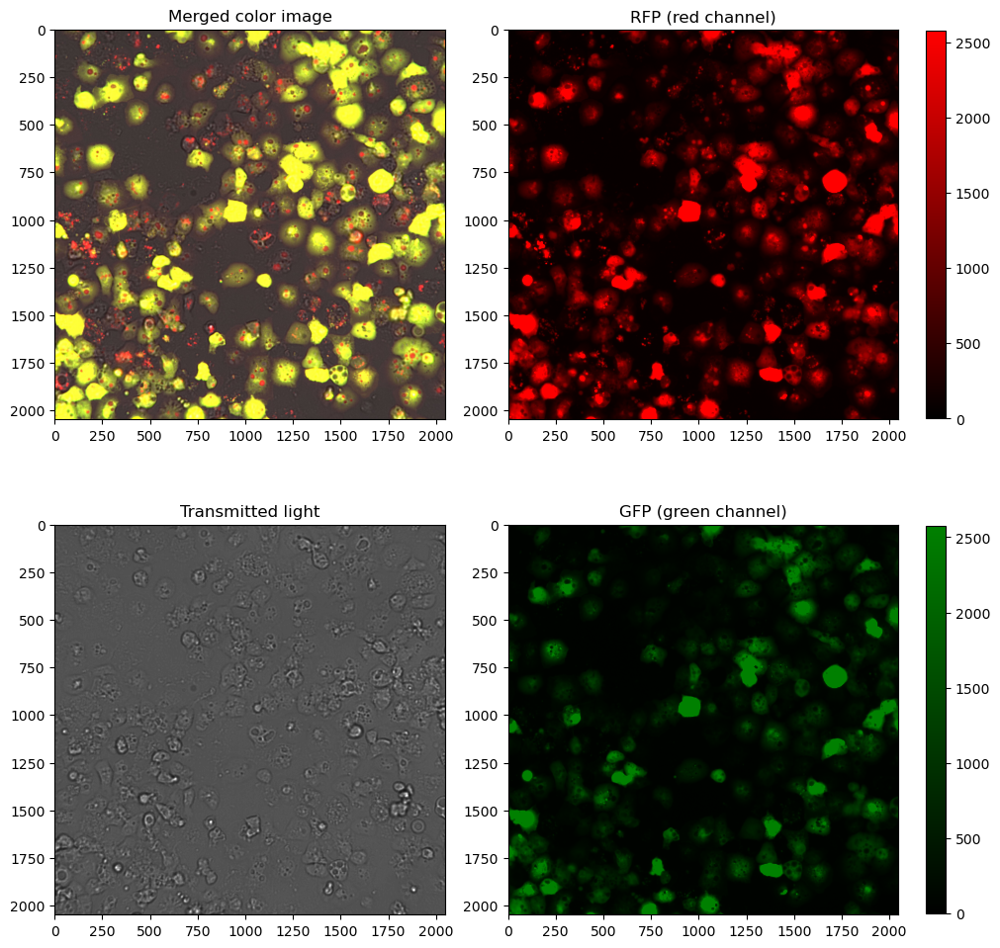

In [8]:
# Example images
plot_cropped(1/12, 0, 0, 2048)

#### A typical 'activated' cell

Here is a close-up of a cell that appears to have a typical activated state of autophagy as described in the paper. The RFP spots overlap with GFP 'empty spots' so that only the red spots are visible in the merged color image. Thus these spots appear to be typical examples of autolysosomes. We also see that not all 'empty spots' in the green image turn into a red spot in the merged image. The spots that are dark in both the red and green tif images remain dark in the merged image, meaning that they are not autolysosomes. There are probably som atg8-free vesicles around?

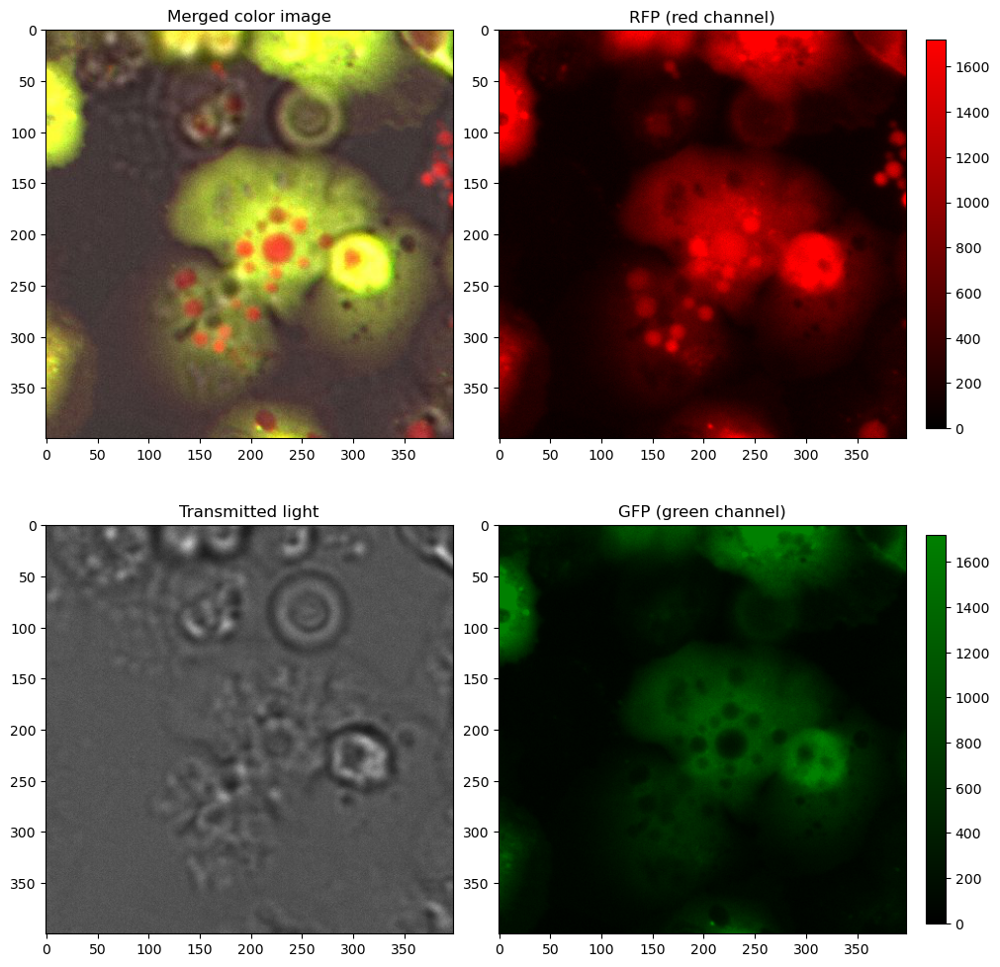

In [9]:
plot_cropped(1/18,1500, 1650, 400)

#### An ambigious cell
Here is a cell that is more peculiar as it has overlapping 'empty' spots in the red and green images that still result in big red spots in the merged color image. Since the spot appears as empty in the red image, it does not fit into the description of an autolysosome. The red and green puncta (small dots) are overlapping and should appear as yellow if they are superimposed (hard to see in the jpg since it is overexposed). 

- What is the big red spot in the merged color image? An autolysosome in the process of being 'filled up' or degraded, meaning it has lower concentration of atg than the cytosol? Or another vesicle that appears red because of 'background' red light being stronger than green?
- It would be nice to check the same cell at other timepoints to see if there is a change of intensity inside the red spot as starvations continues.

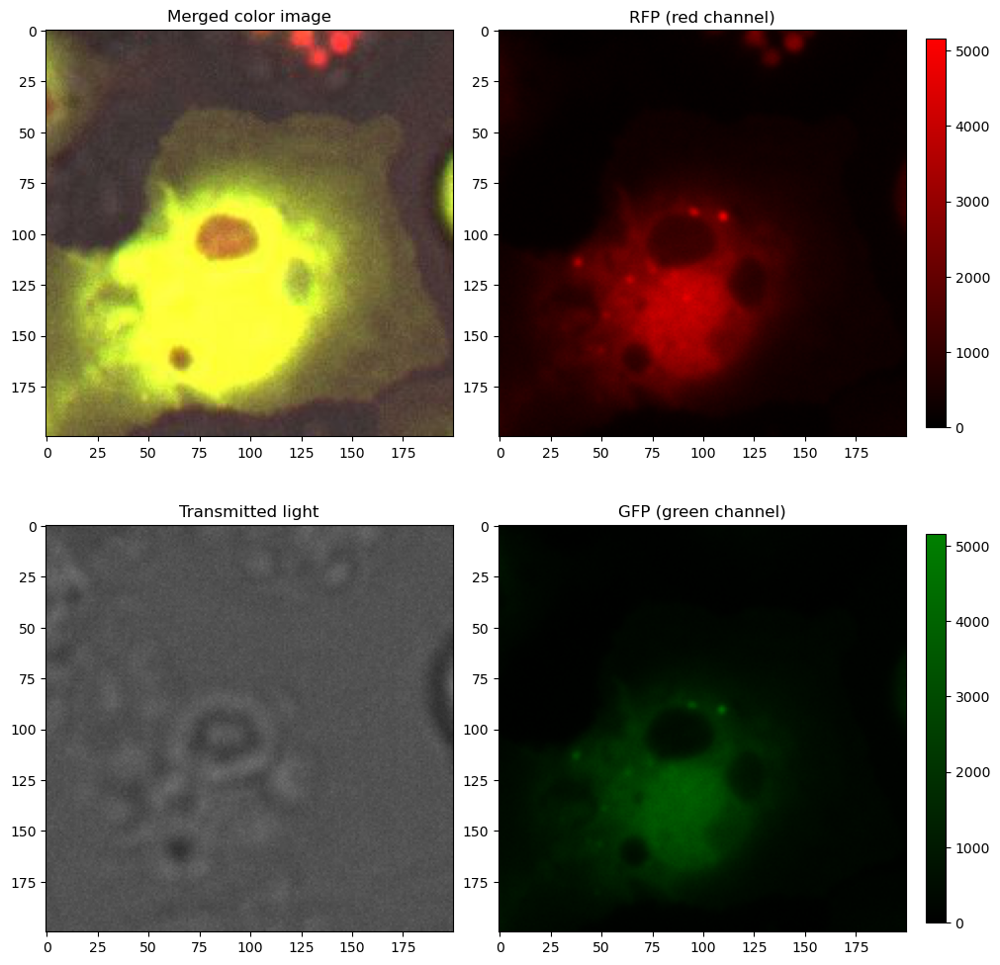

In [10]:
#This cell has overlapping dark spots. On the merged jpg image, the spots however appear as red. 
#Is this an autolysosome or is it only an effect created by the image merging or difference in "background" light
plot_cropped(1/6,200, 220, 200)

#### A dark cell

Here is a close-up on a dark cell where only red spots are visible. When adjusting the brightness in the tif images, the light from the GFP becomes appearant. Thus, the cell still has green light, however, it is masked when merged with the red and the transmitted light channels. Interestingly, the green light still forms spots at some of the same locations as the red spots. Since no green light should be emitted from autolysosomes, these spots should be something else. What is it, and why would the RFP have much stronger signal at these spots? The signal is only stronger on the spot-level, not in the entire cell (the cell contours are barely visible in both green and red images). Helene mentioned the red RFP tag may not degrade fast. This may lead to accumulation of red light (inside or outside of autolysosomes?). Is this what we observe? Also, could the presence of big red spots without much 'background' color be an indication of autogphagy using the atg8 faster than it is produced?

- Is it possible for autolysosomes to also contain some green puncta? Perhaps there is a lag before the green probe is quenched, or perhaps some of the probes can stay intact?
- Could the presence of big red spots without much 'background' color be an indication of autogphay using the atg8 faster than it is produced?
- Or could they be a sign of accumulation of non-degraded (but used) RFP?

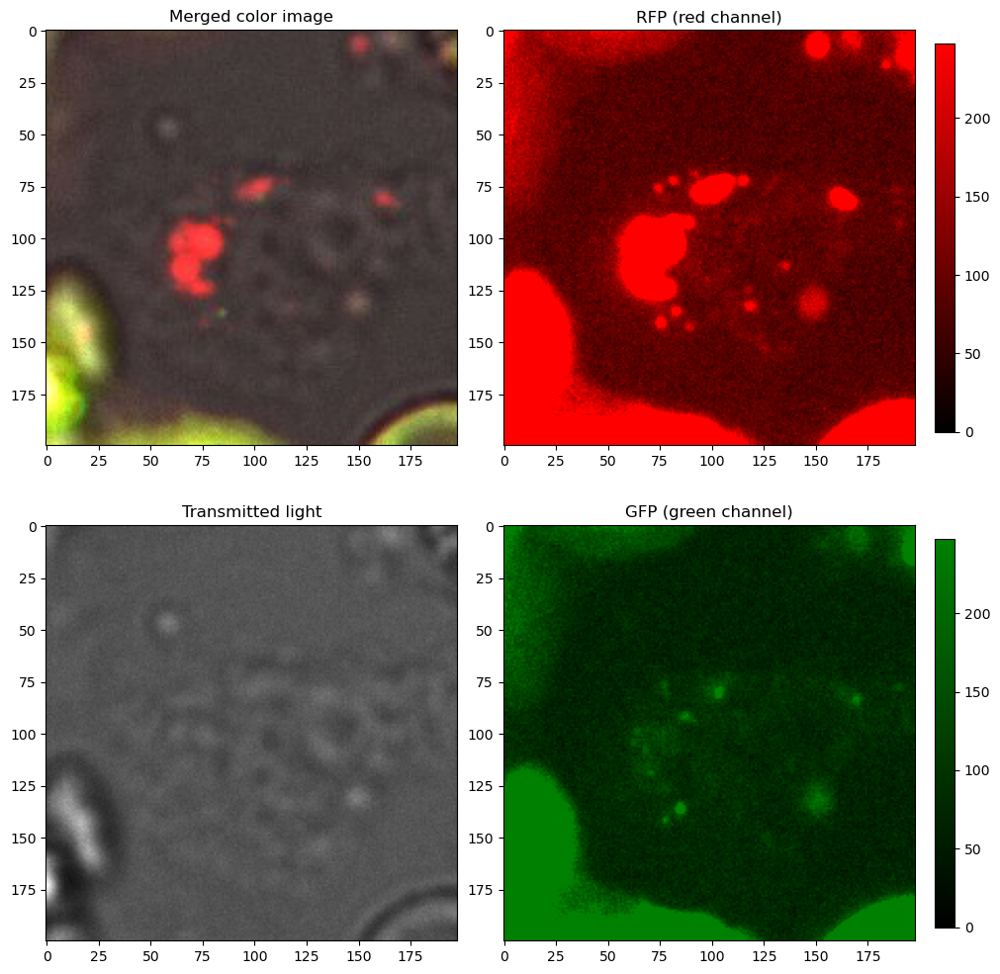

In [11]:
# Dark cell with red spots and cranked up pixel value
plot_cropped(1/125, 1250, 1850, 200)

#### Segmented and annotated cells with their histograms
Here are some segmented and classified cells from the dataset. In these images the lowest and highest values were disregarded (parameter that can be changed) so that the interesting range could be more easily studied. The histograms of pixel value frequency were also plotted (now with all elements included). 

- The histograms show a shift between the red and green intensities, were the green seem to hover at a higher value while keeping the same distribution (the plots have similar 'shapes'). Unless there is something that could degrade the RFP tag while keeping the GFP tag intact (opposite of what happens in autolysosomes), there should never be more GFP tags than RFP tags around. Does this mean that one GFP tag emits more light than a RFP tag? Or were the settings when taking the images different? Or are there other reasons that the red light does not reach the camera lense with the same intensity as the green?
- Often some spread values at higher intensities are visible only in the red histograms, indicating the presence of red-only puncta in the cell?
- Is this shift present in all of the dataset or only by coincidence here?

In [12]:
# Unfed images
img1 = "unfed/Timepoint_001_220518-ST_C03_s1_176.png"
img2 = "unfed/Timepoint_001_220518-ST_C03_s1_177.png"
img3 = "unfed/Timepoint_001_220518-ST_C03_s1_178.png"
# Fed images
img4 = "fed/Timepoint_001_220518-ST_C03_s1_0.png"
img5 = "fed/Timepoint_001_220518-ST_C03_s1_1.png"
img6 = "fed/Timepoint_001_220518-ST_C03_s1_12.png"


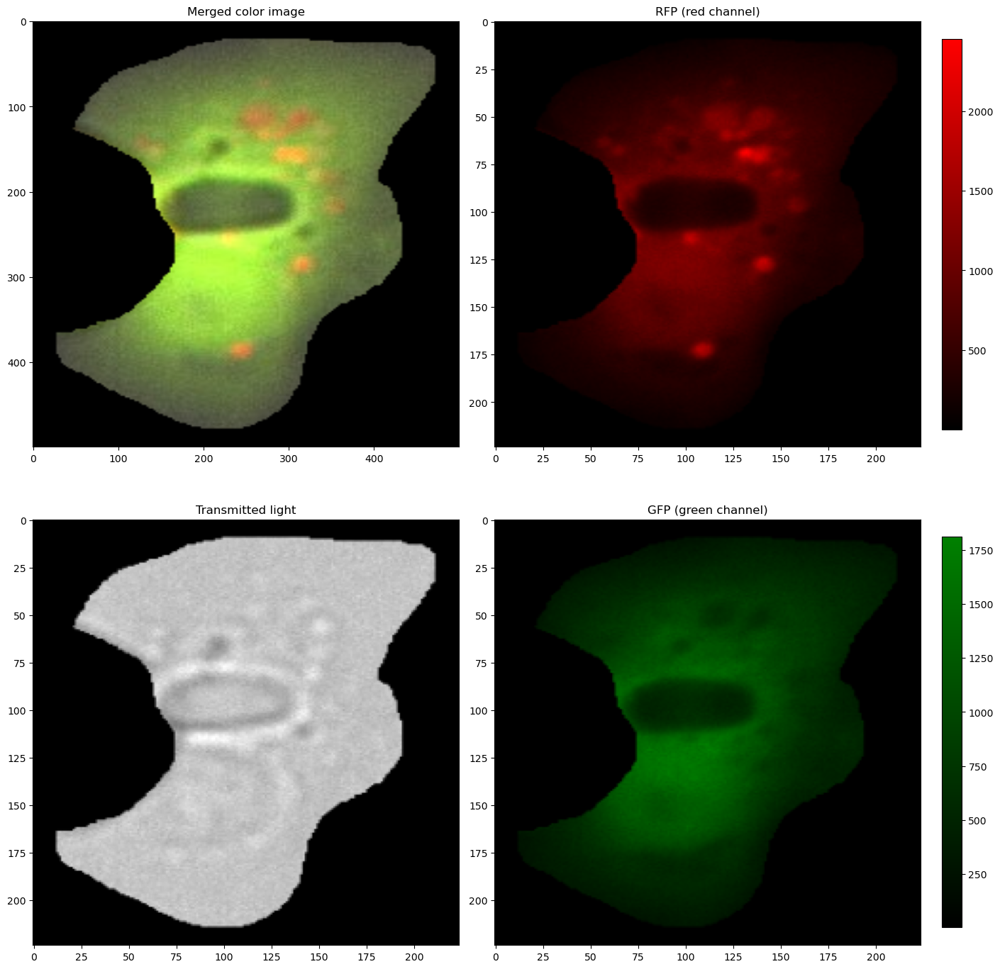

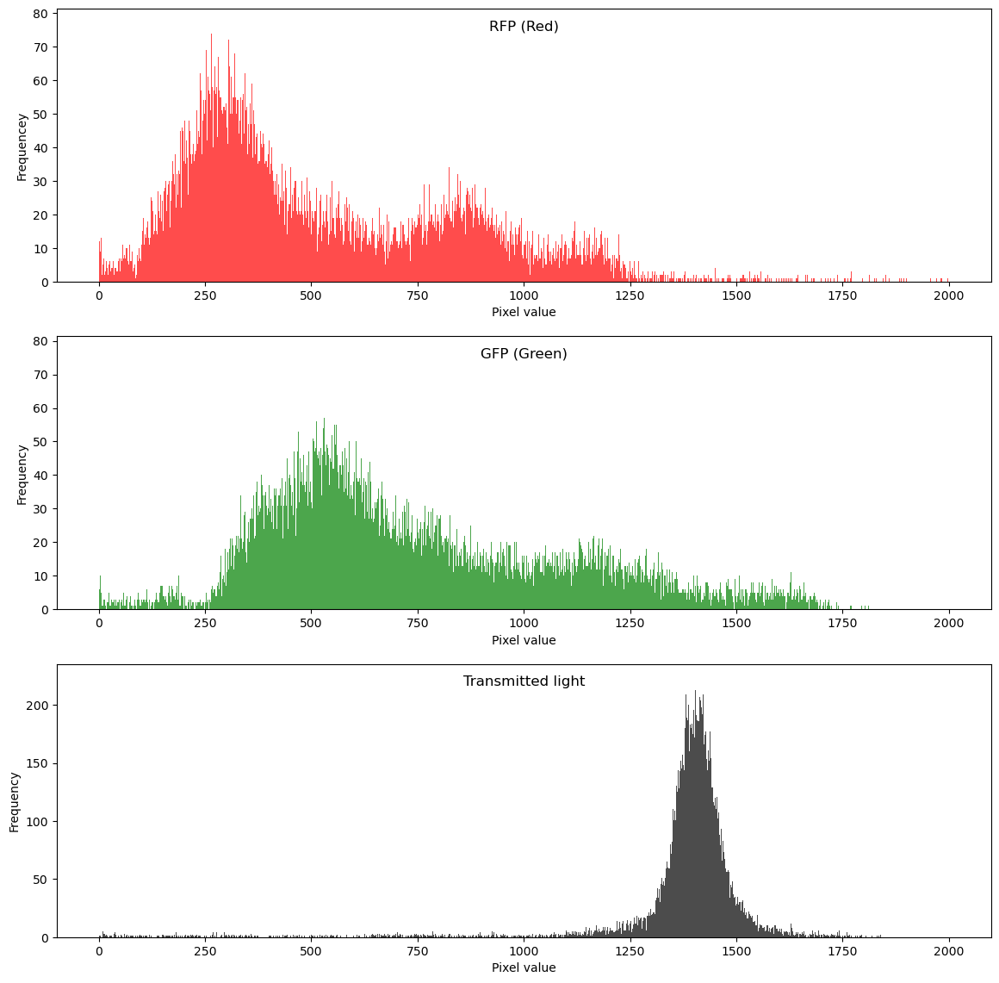

In [13]:
# the two last arguments are low and high threshold for pixel values to plot
plot_segmented_cell(img1, 0,100)
make_histograms(img1)

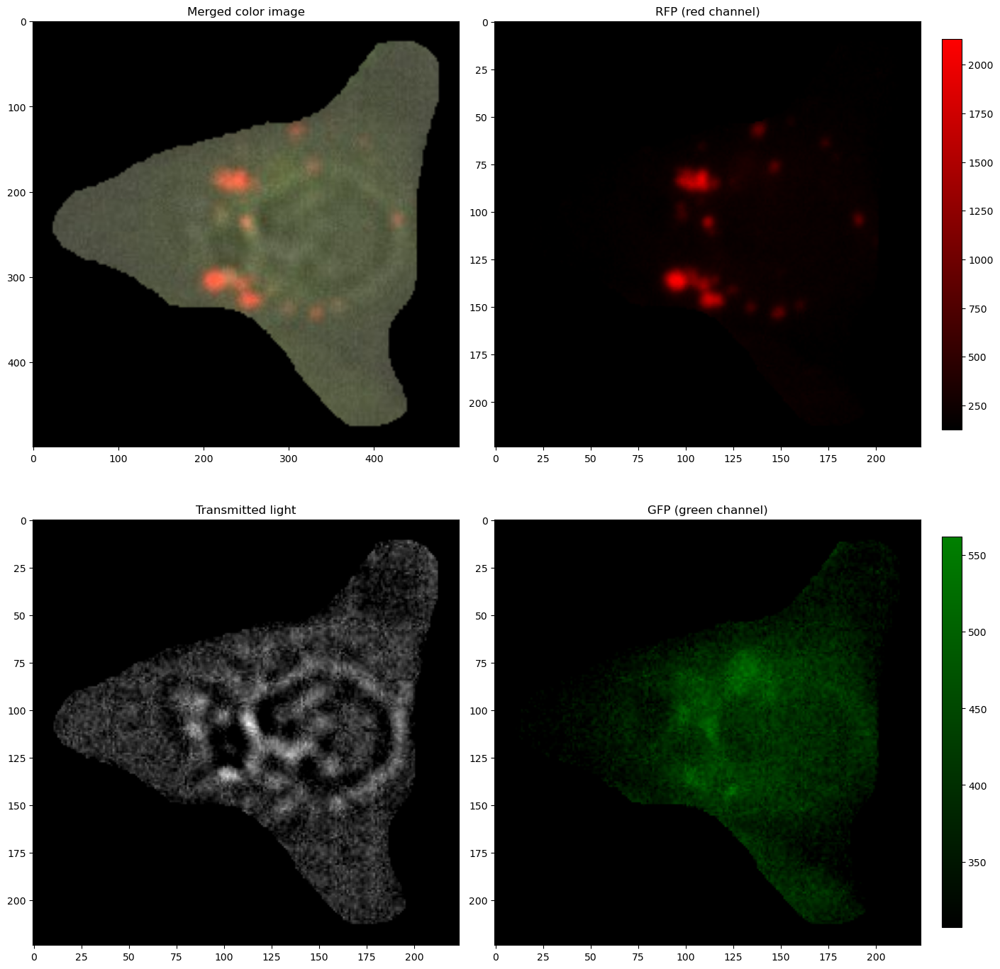

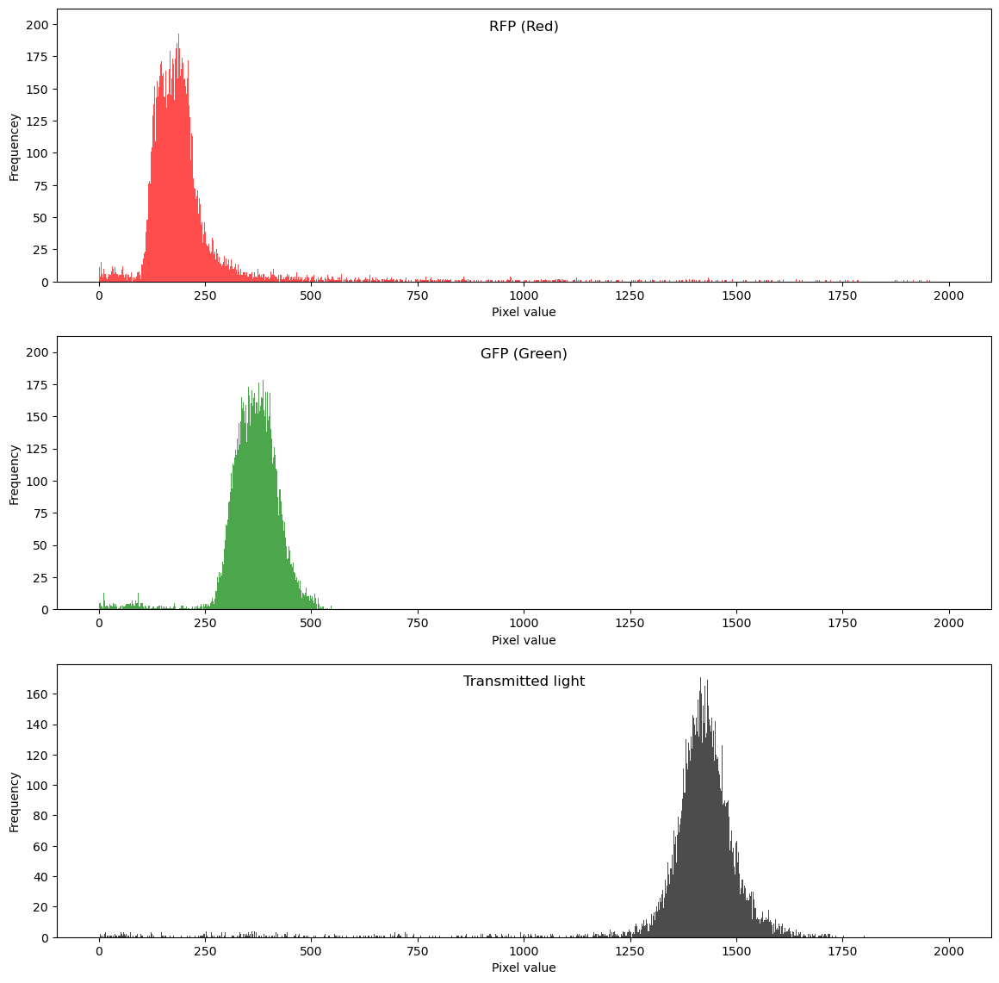

In [14]:
# the two last arguments are low and high threshold for pixel values to plot
plot_segmented_cell(img2, 10,100)
make_histograms(img2)

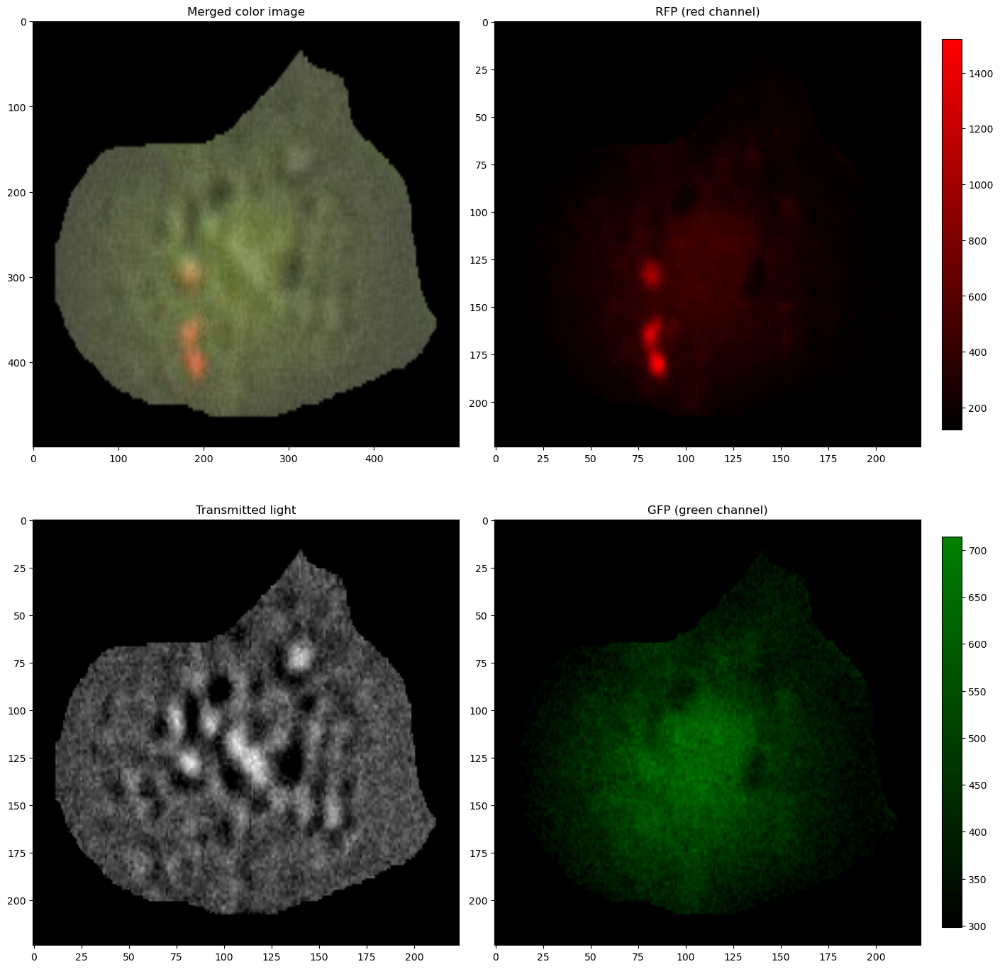

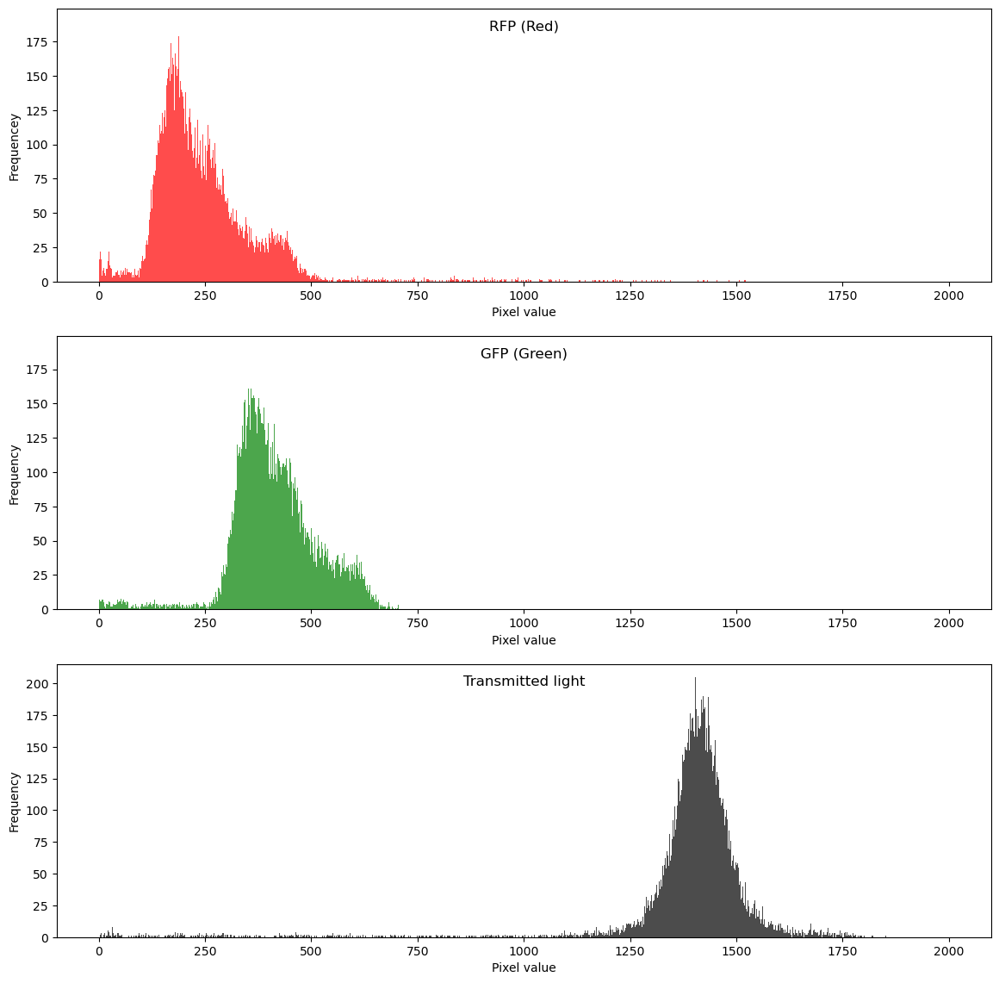

In [15]:
# the two last arguments are low and high threshold for pixel values to plot
plot_segmented_cell(img5, 5,100)
make_histograms(img5)

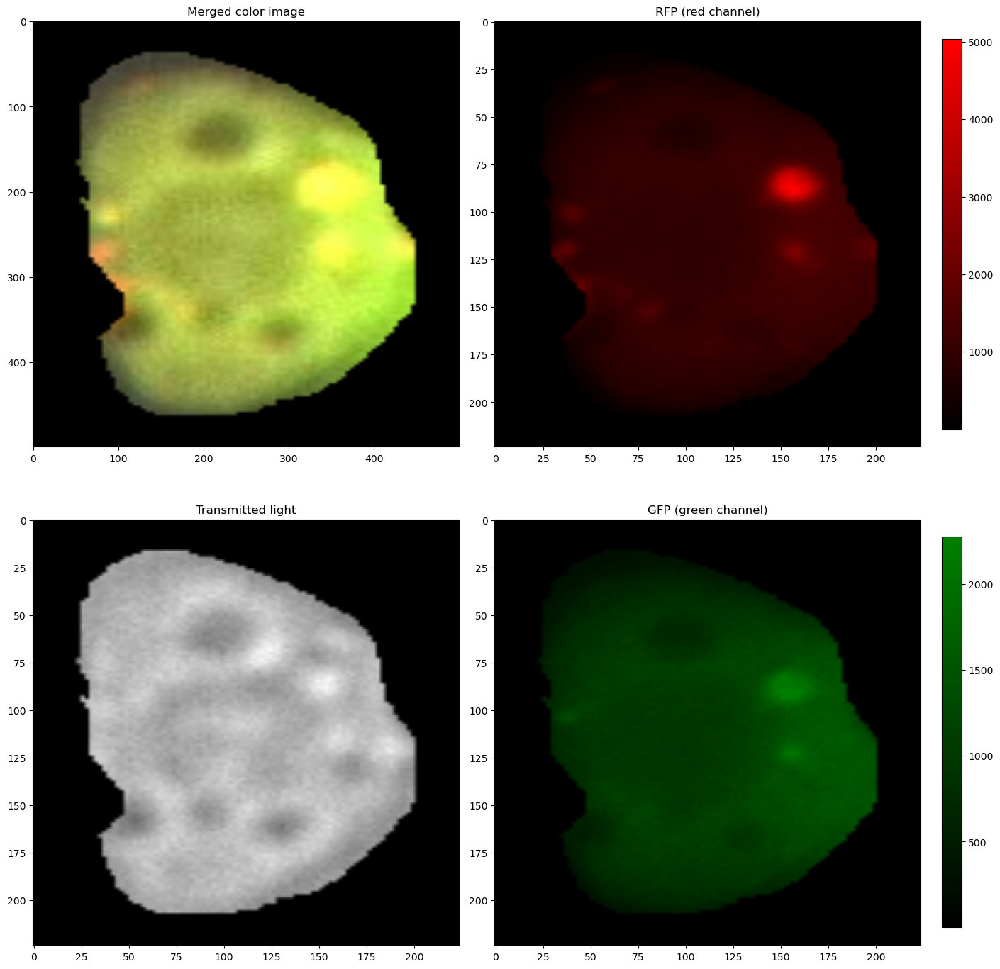

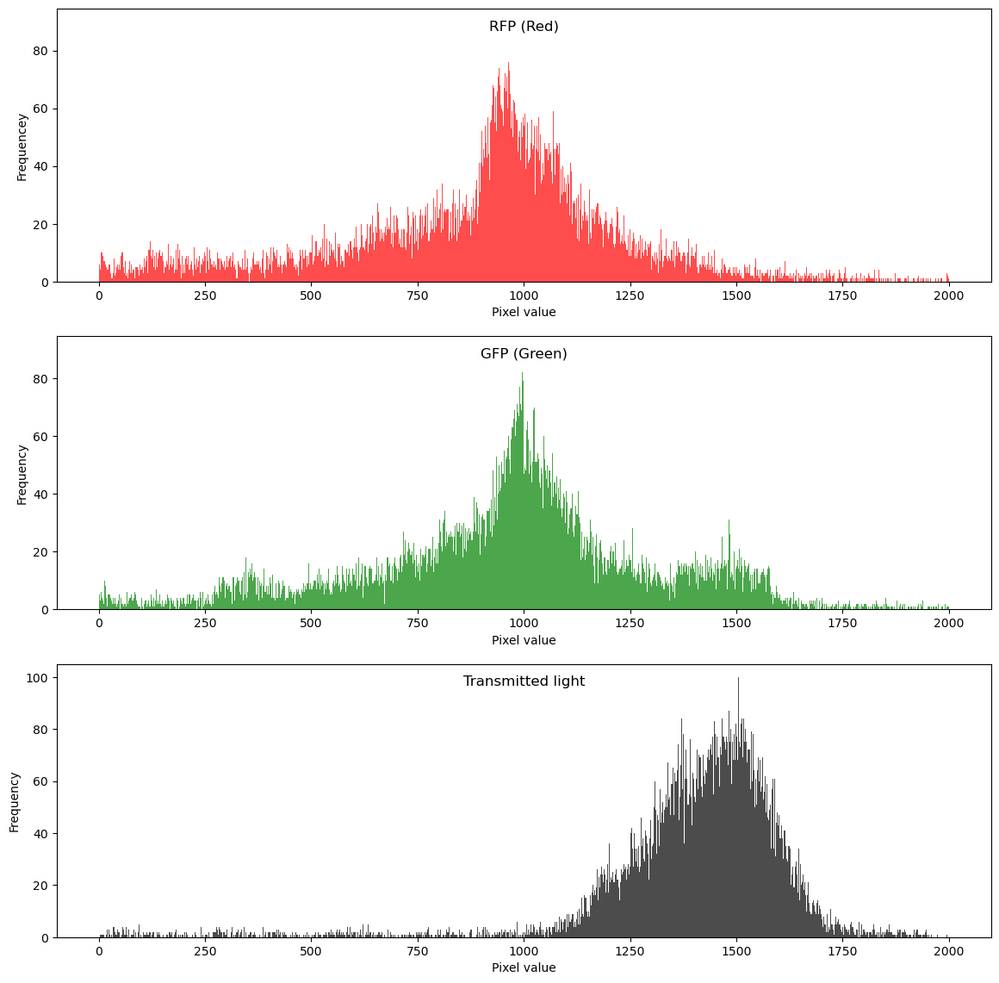

In [16]:
# the two last arguments are low and high threshold for pixel values to plot
plot_segmented_cell(img6, 0,100)
make_histograms(img6)

#### The pixelwise difference between red and green signals

To visualize the intensity shift between the red and the green images at pixel level, the pixelwise difference between the images are shown below. The red image is calculated as red_pixel_value-green_pixel_value, and the green is the opposite (values below 0 are disregarded). Typically, the cell in general has a higher green pixel value except for on and around red puncta. Notice that some of the yellow-appearing spots in the fed cell of img6 actually have substancially higher red signal than green. Why doesn't it look more red? Is it due to the color merging settings?

- How come some of the overlapping red/green spots have much higher red signal? Autophagosomes should have equally many GFP and RFP tags, and autolysosomes should not have any green signal left. Are we seeing the "filling" of autolysosomes by arriving autophagosomes? Do the red dots become stronger as time of starvation is increasing?
- If the level of autophagy is evaluated based on the red spots and yellow puncta, it could be fun to try to find these automatically by segmentation and then evaluate the different intensities within the spots. Perhaps we can link the statistics of the puncta to the ground thruth and find some characteristics? Perhaps the puncta area could be compared further to the cell area, if the cell area is proportional to the cell volume? Or is nucleous area a better measure? That would give an indication of 'how much of the cell volume is reserved for autolysosomes'. Granted that this is linked to autophagic flux, of course.


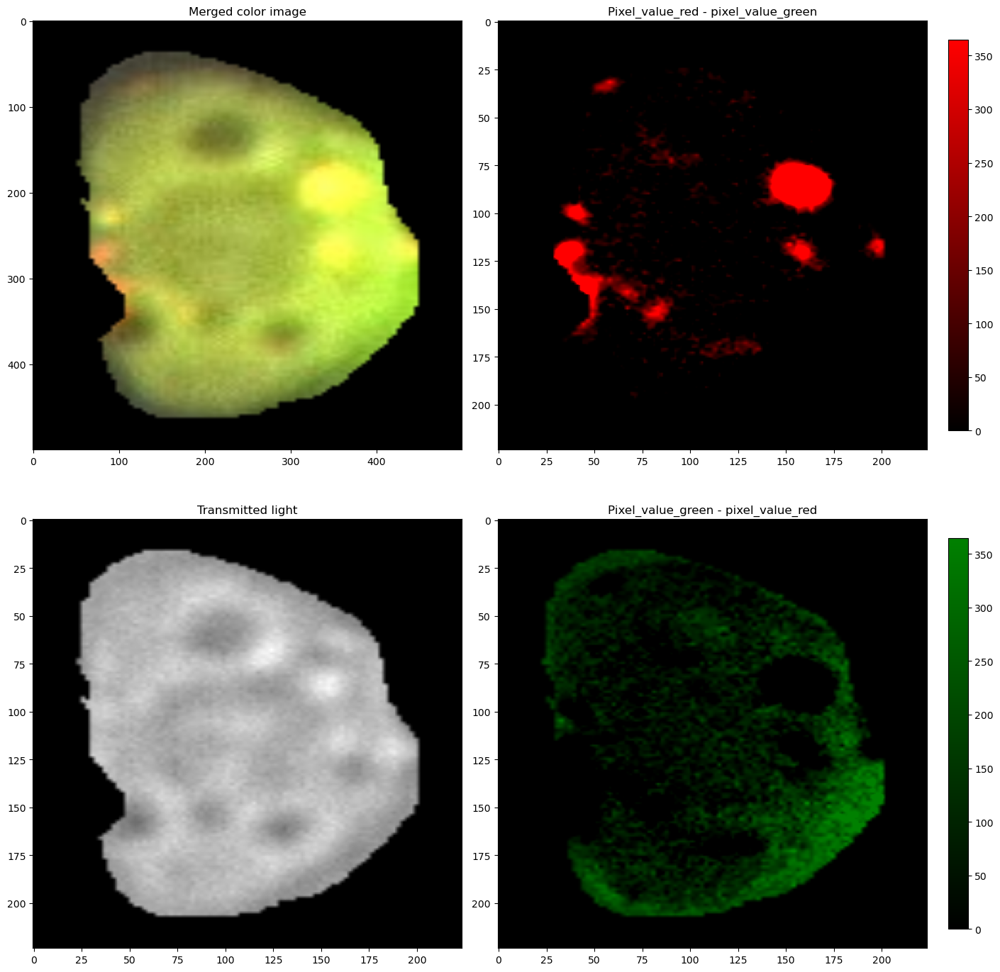

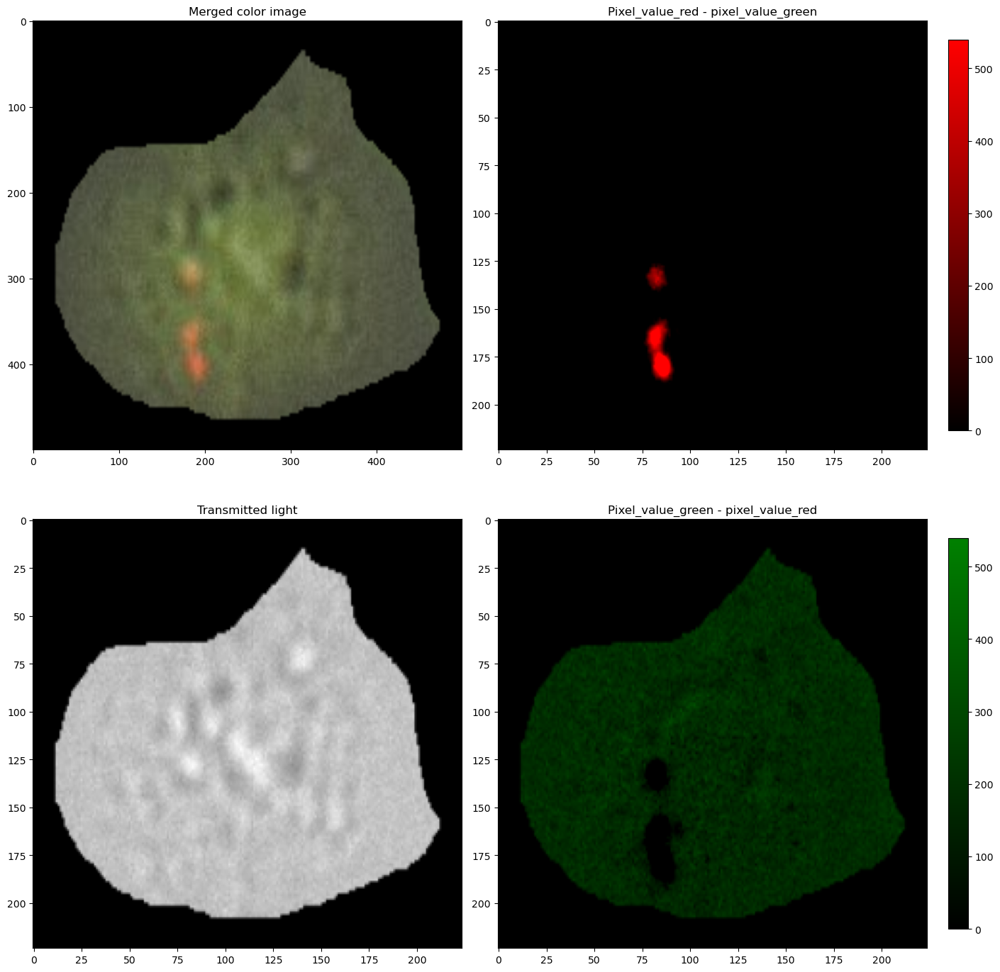

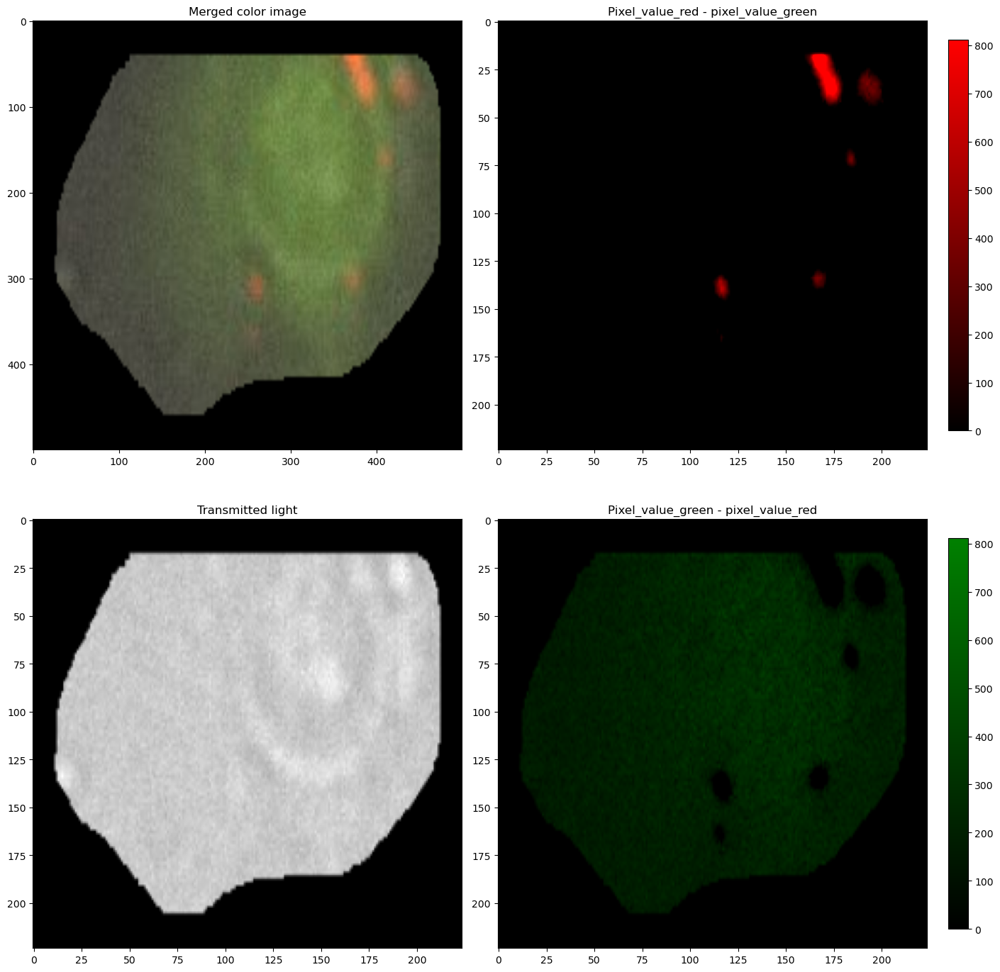

In [17]:
plot_segmented_cell_diff(img6,1/8)
plot_segmented_cell_diff(img5, 1/2)
plot_segmented_cell_diff(img4, 1/2)


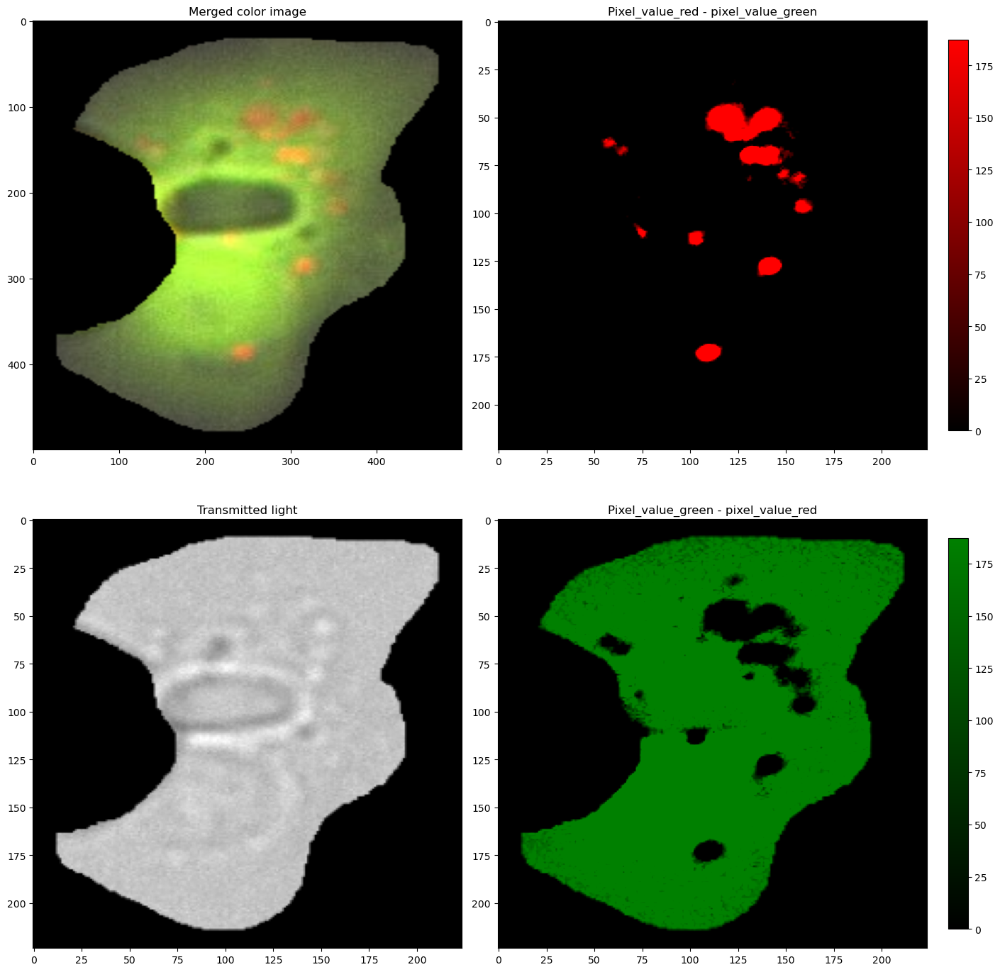

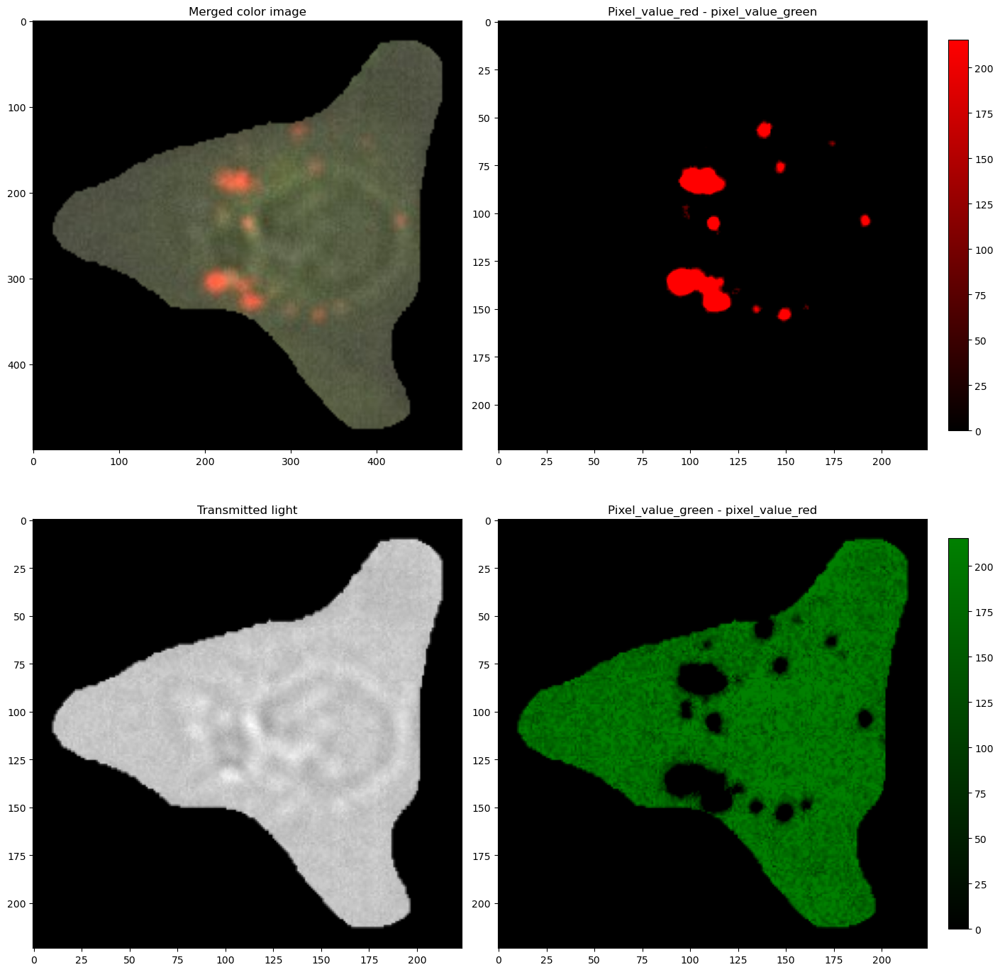

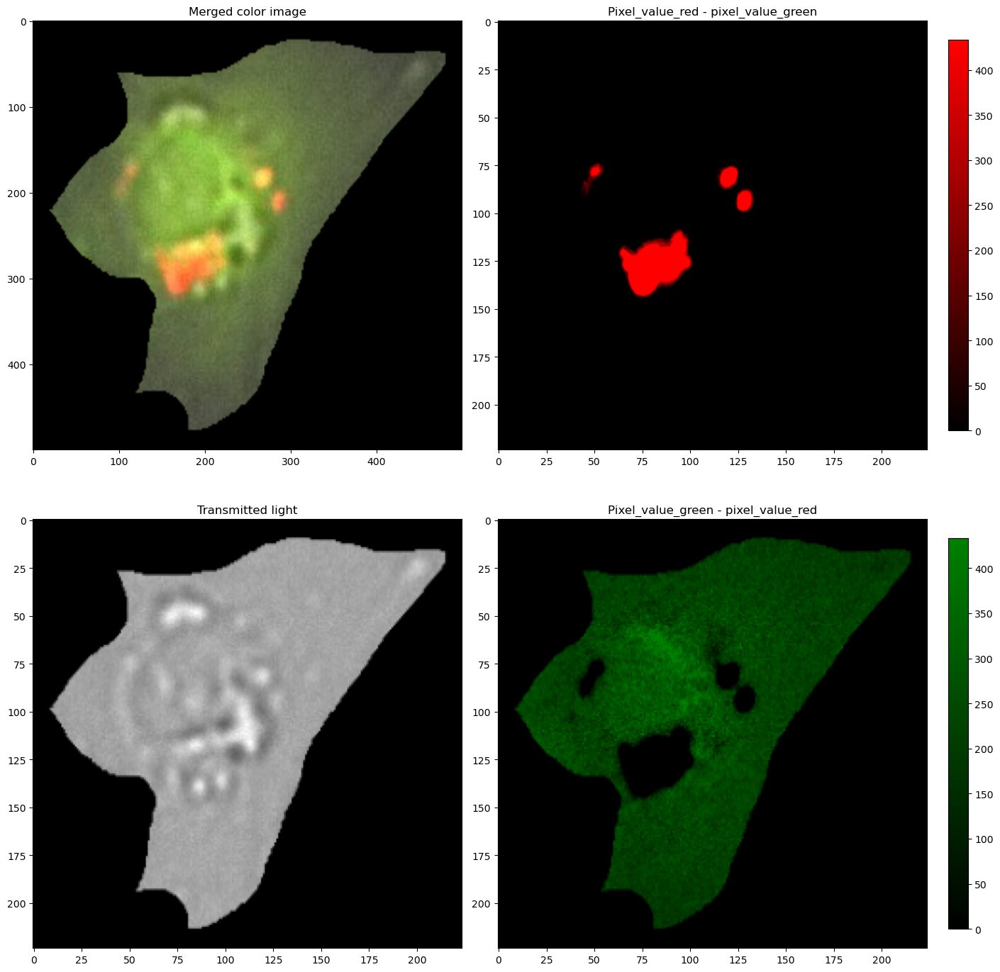

In [18]:
plot_segmented_cell_diff(img1, 1/8)
plot_segmented_cell_diff(img2, 1/8)
plot_segmented_cell_diff(img3, 1/8)

### Video of cells 
To see if it easier to make sense of the red dots when looking at the full timelapse, we did a manual zoom on some cells. Bellow is the same cell across all five timepoints (only cropped, not segmented). In this plot, the red and green images have been normalized individually at each time step, so their intensities cannot be compared across images (should have added color bar but it becomes very messy). 
- The autolysosomes seem to be merging, is this possible? Or are some disappearing an others growing? We would need more time steps to be sure.
- Often there is a yellow spot at the border of a red spot. Are we seeing autophagosomes merging with autolysosomes? Can an autolysosome merge with autophagosomes or is it always autophagosome+lysosome?
- How do we expect the lysosome to look before merging with an autophasome? Is it a dark spot that contains no atg8? Or does it contain the same atg concentration as the cytosol, meaning it would be visible in the green image but not the red?

Another question:
- Where is the nucleous? When we look at the cell as a 2d object, do we expect the autophagosomes/autolysosomes to be placed on the top of the nucleous as well? Why is there often a circle of red spots?

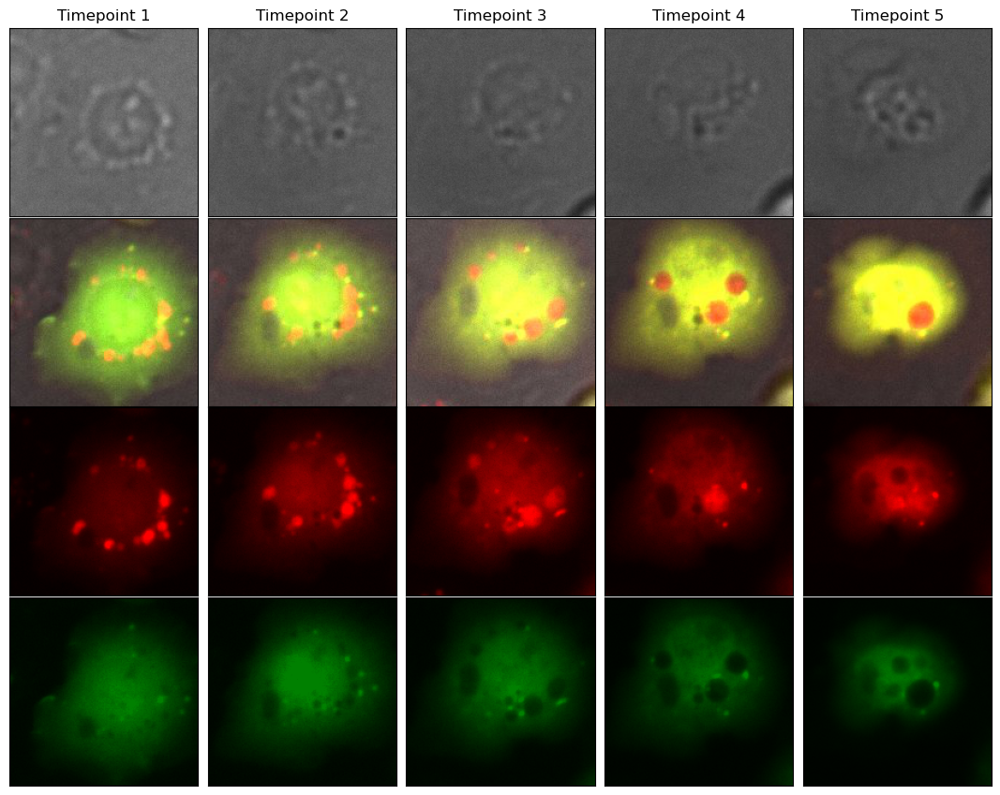

In [48]:
# choose images
img = video_list_unfed[2]
# crop
start_x = 525
start_y = 1115
crop_size = 170
# set intensity factor
max_factor = 0.8
# Plot images, green and red are normalised individually at wach time step
plot_still_img_all(img, max_factor, start_x, start_y, crop_size) 

Here is the same cell but instead the green and red images are normalized against the same max value, meaning that their intensities keep the same scale across probe type and timepoints.
- The red and green intensities are increasing with every timepoint. The red probe could be accumulating, but do we also expect an increase in production of atg8?
- Could it be a visual effect due to the cell shrinking/getting more round and the atg migration towards center?

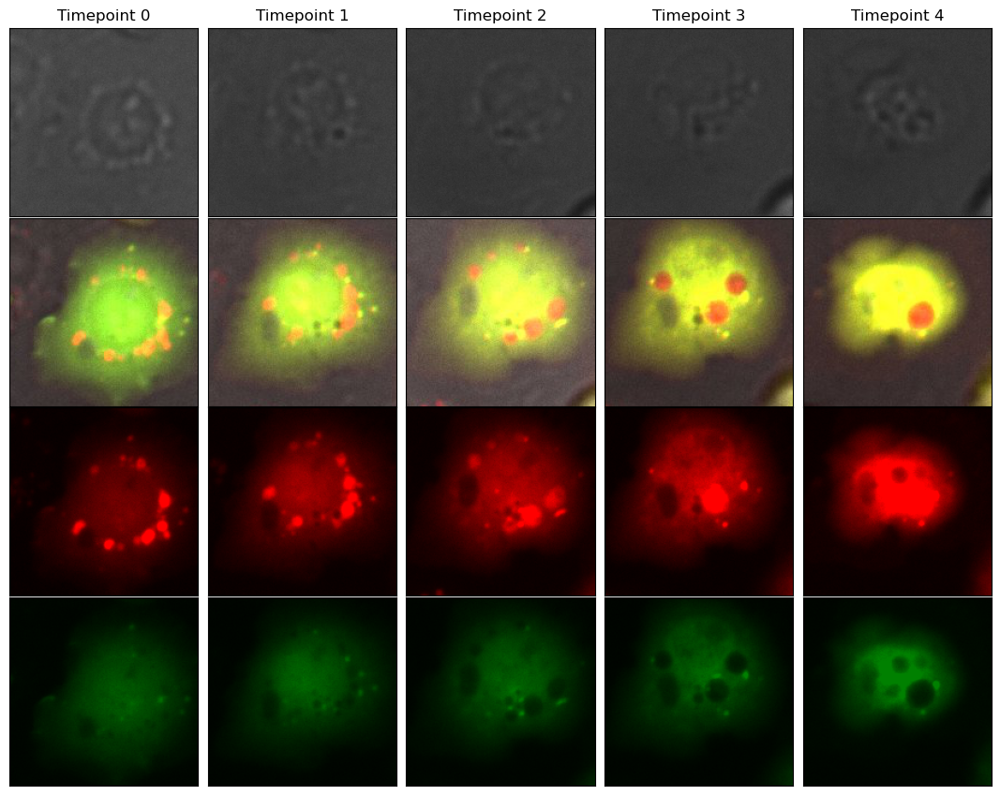

In [52]:
# choose images
img = video_list_unfed[2]
# crop
start_x = 525
start_y = 1115
crop_size = 170
# set intensity factor
max_factor = 0.1
# Plot images, green and red are normalised individually at wach time step
plot_still_img_all_norm(img, max_factor, start_x, start_y, crop_size) 

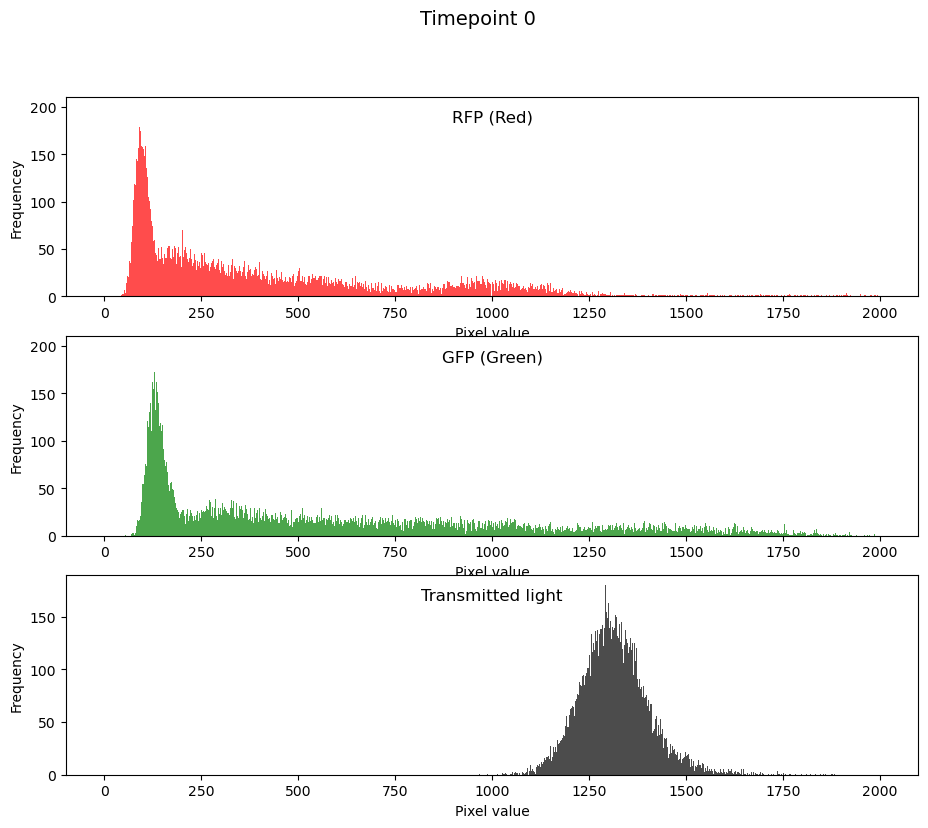

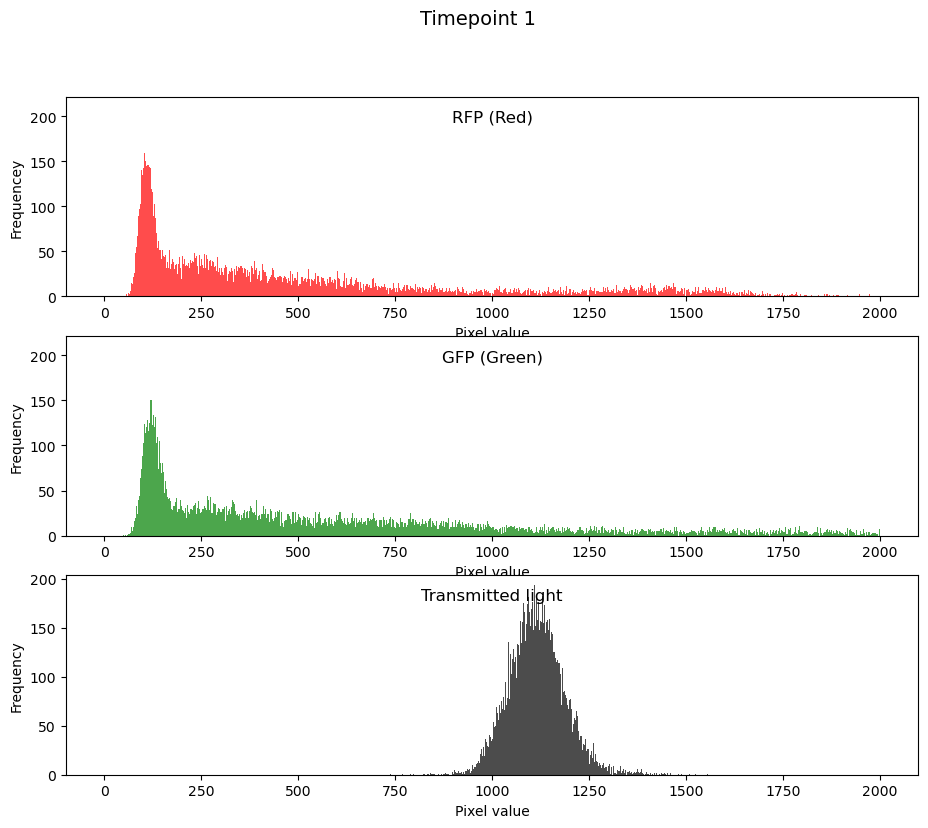

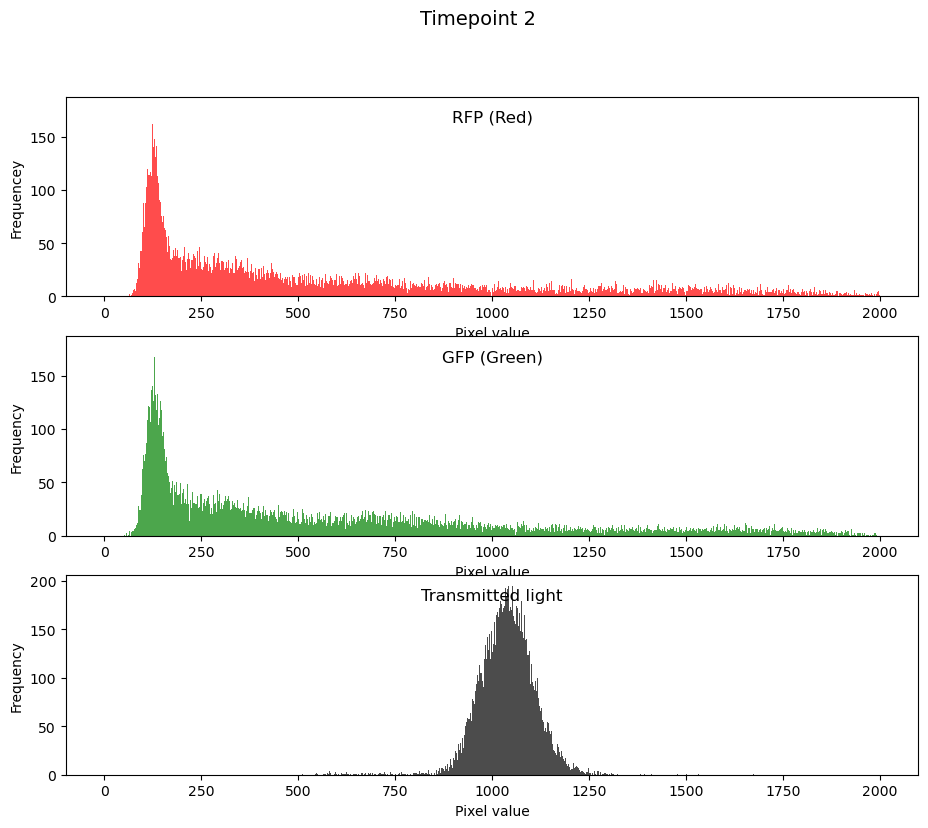

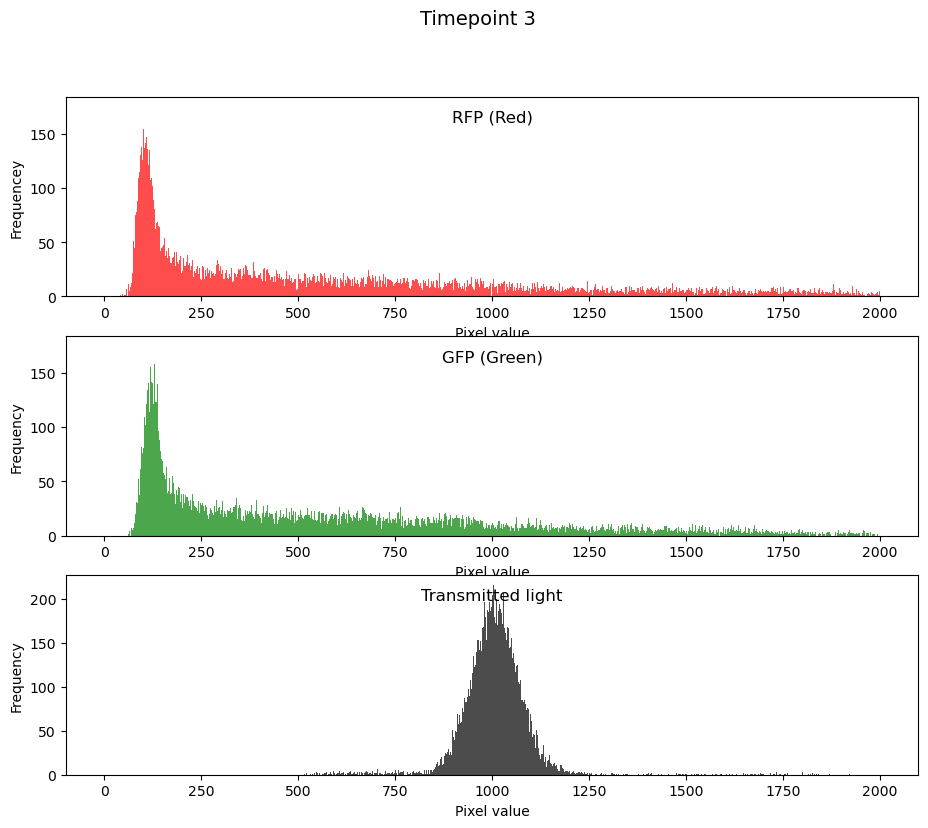

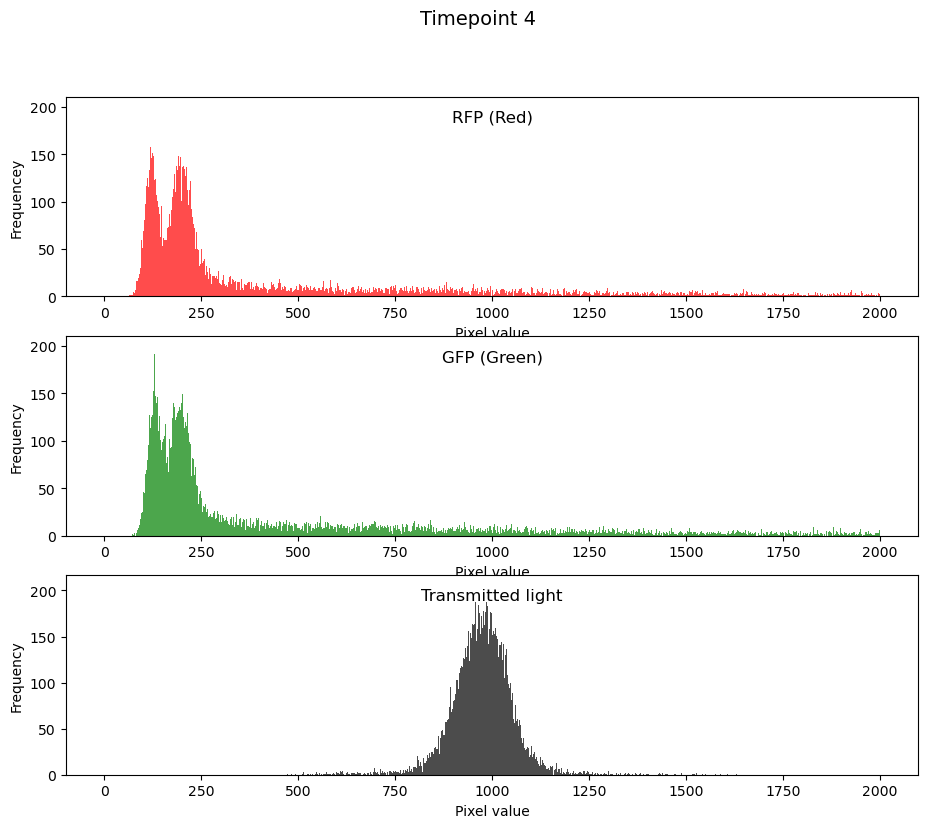

In [50]:
img = video_list_unfed[2]
color_list, red_list, tl_list, green_list = make_timepoint_list(img)

# crop
start_x = 525
start_y = 1115
crop_size = 170

for i in range(5):
    red_image = crop(red_list[i],start_x, start_y, crop_size)
    green_image = crop(green_list[i],start_x, start_y, crop_size)
    grey_image = crop(tl_list[i],start_x, start_y, crop_size)
    
    make_histograms_cropped(red_image, green_image, grey_image, i)

#### Another cell across all five timepoints

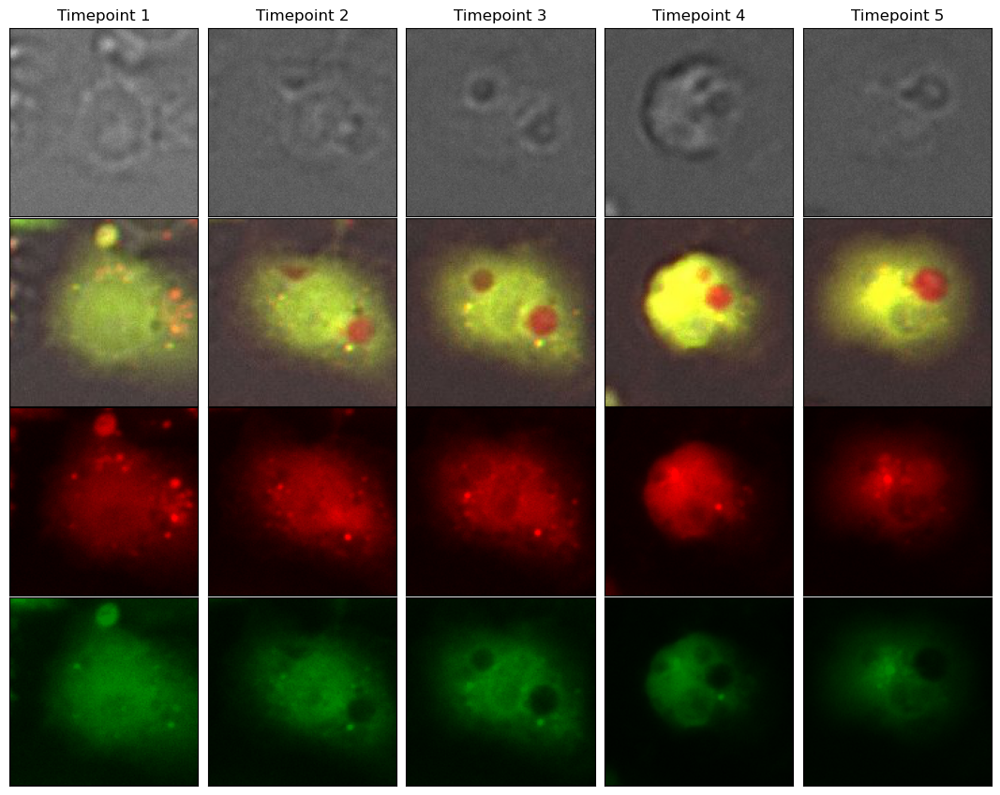

In [22]:
# get video
img = video_list_unfed[0]
# crop
start_x = 975
start_y = 1525
crop_size = 140

# set intensity factor
max_factor = 0.8
plot_still_img_all(img, max_factor, start_x, start_y, crop_size)

Here are the histograms of the frames above. Since there is a lot of things going on in the background, it may be hard to know if intensity changes come from the cell or the background. The best would be to track a cell and look only at the segmented cell, but so far tracking we haven't tested Oriana's tracking method. 
- The intensity shift between red and green seem to disapear with increased autophagy
- The transmitted light seem to decrease the first hours
- Changes are subtle and the backgroun may impact the histograms

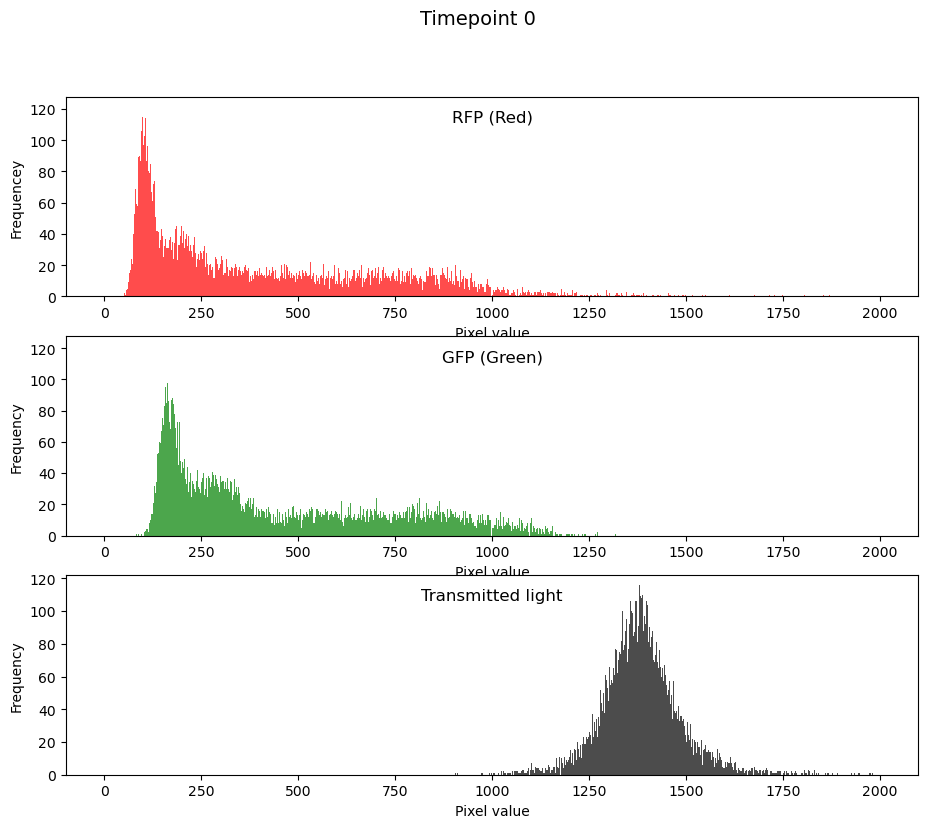

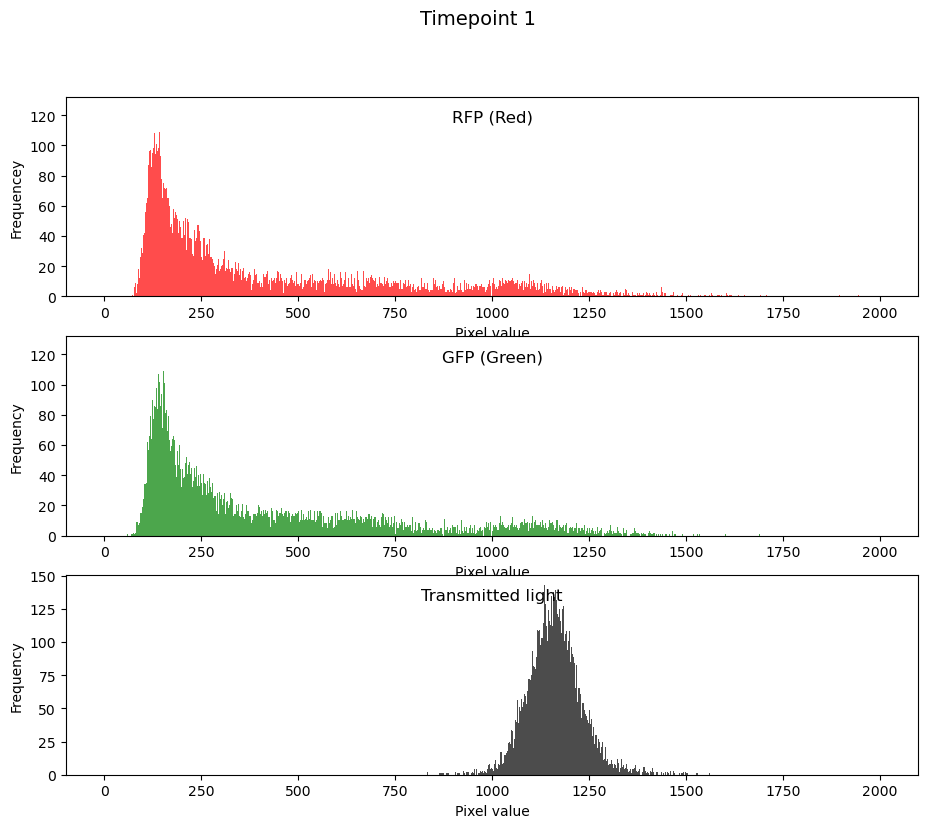

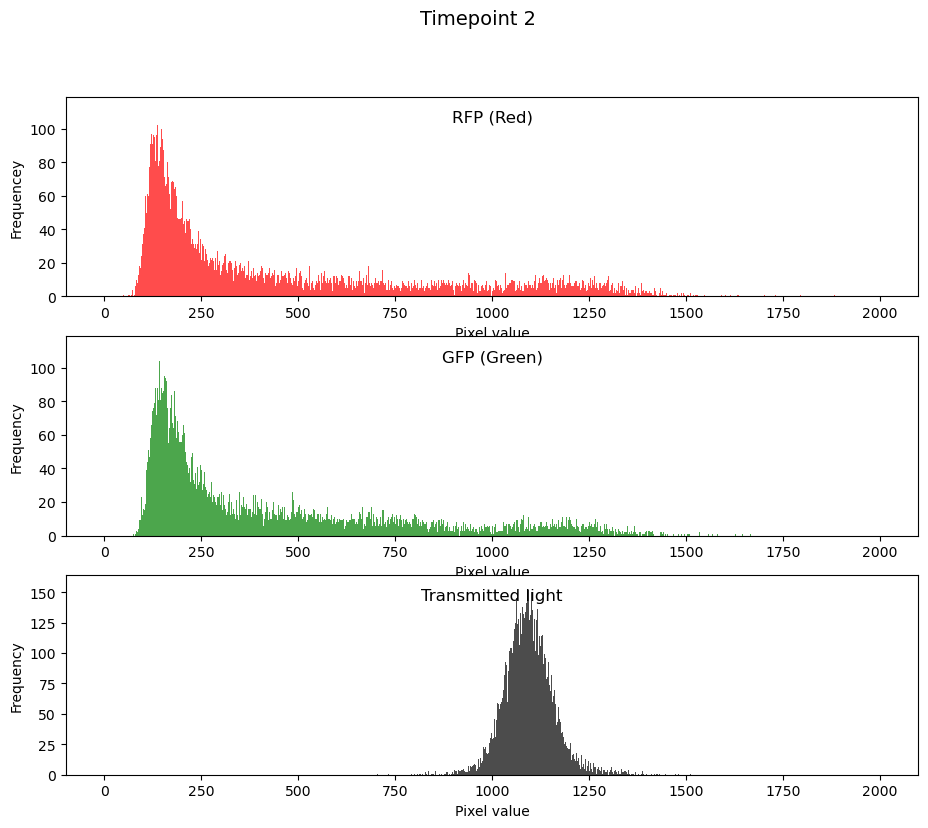

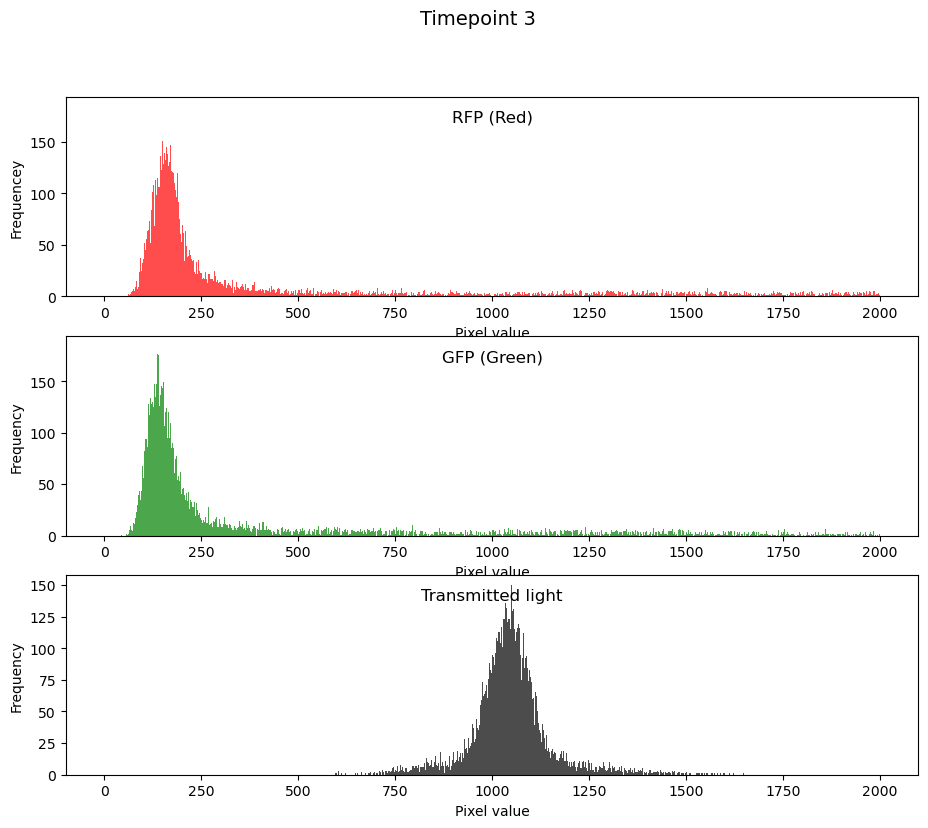

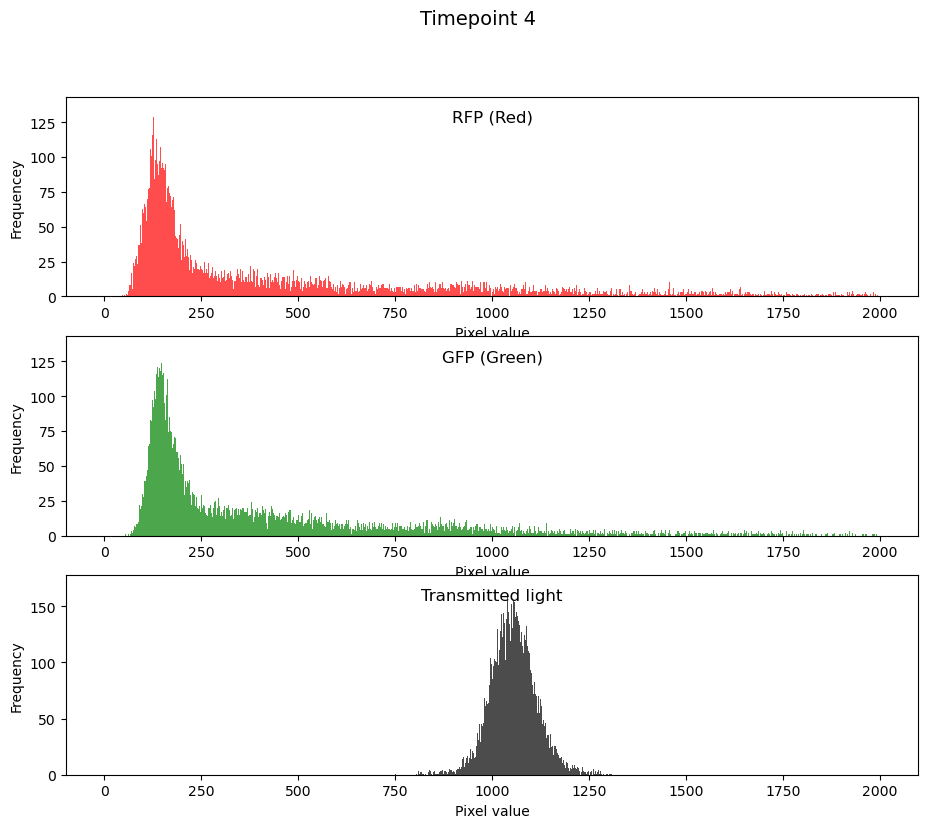

In [23]:
img = video_list_unfed[0]

color_list, red_list, tl_list, green_list = make_timepoint_list(img)

start_x = 975
start_y = 1525
crop_size = 140

for i in range(5):
    red_image = crop(red_list[i],start_x, start_y, crop_size)
    green_image = crop(green_list[i],start_x, start_y, crop_size)
    grey_image = crop(tl_list[i],start_x, start_y, crop_size)
    
    make_histograms_cropped(red_image, green_image, grey_image, i)



### Some questions about the segmentation/annotation

From the CELLULAR data set: 
#### "(...) the major reasons for annotation as “unknown” were: very high or very low expression of the green/red fluorescence reporter, out-of-focus cells, highly aberrant cell shape or clumped cells."

- In the case of very high expression of the fluorescence reporters, quite some of the segmented cells can be better visualized when normalizing within each cell instead of across the full image.
- Sometimes we come across some odd looking cells inside of the "basal" and "activated" groups. Should we take notes, and double check with experts if they are ok before using them in the data set?

In [24]:
def plot_doubles(images):
    current_dir = os.getcwd() 
    double_dir = current_dir + "/color/double"

    plt.rcParams['figure.figsize'] = [8, 20]
    fig, axes = plt.subplots(nrows=5, ncols=2) #, constrained_layout=True)
    
    for i in range(5):
        img_path = os.path.join(double_dir, images[i])
        mask_path = os.path.join(double_dir, 'mask_'+ images[i])
        color_image = Image.open(img_path)
        mask_image = Image.open(mask_path)
        
        fig.tight_layout()
        im1 = axes[i][0].imshow(color_image)
        im2 = axes[i][1].imshow(mask_image)

        # Set plot title and labels
        axes[i][0].set_title(f'{images[i]}')

def plot_segmented_cell(img, max_factor):
    current_dir = os.getcwd() 
  
    # Get images as np array
    red_image = np.asarray(Image.open(current_dir+"/red/" + img +".png"))
    green_image = np.asarray(Image.open(current_dir+"/green/"+img+".png"))
    grey_image = np.asarray(Image.open(current_dir+"/grey/" + img+".png"))
    color_image = Image.open(current_dir+"/color/"+img+".png")
    
    # find max to scale both images by the highest value
    max_value = np.max([np.max(green_image), np.max(red_image)])
 
    # Create a normalization object to scale the data
    norm = mcolors.Normalize(vmin=0, vmax=max_value*max_factor)
    
    # Create the colormaps
    red_cmap = LinearSegmentedColormap.from_list("", ["black","red"])
    green_cmap = LinearSegmentedColormap.from_list("", ["black","green"])
    grey_cmap = LinearSegmentedColormap.from_list("", ["black","white"])
    
    # Plot the cells
    plt.rcParams['figure.figsize'] = [9, 9] 
    fig, axes = plt.subplots(nrows=2, ncols=2, constrained_layout=True)
    im1 = axes[0][0].imshow(color_image)
    im2 = axes[0][1].imshow(red_image, cmap = red_cmap, norm=norm)
    im3 = axes[1][0].imshow(grey_image, cmap = grey_cmap)
    im4 = axes[1][1].imshow(green_image, cmap = green_cmap, norm=norm)

    axes[0][0].set_title('Merged color image')
    axes[0][1].set_title('RFP (red channel)')
    axes[1][0].set_title('Transmitted light')
    axes[1][1].set_title('GFP (green channel)')
    # Add colorbar 
    cbar1 = fig.colorbar(im2, ax=axes[0][1], shrink = 0.8)
    cbar2 = fig.colorbar(im4, ax=axes[1][1], shrink = 0.8)

def plot_channels(img, max_factor):
    current_dir = os.getcwd() 
  
    # Get images as np array
    red_image = np.asarray(Image.open(current_dir+"/red/" + img +".png"))
    green_image = np.asarray(Image.open(current_dir+"/green/"+img+".png"))
    grey_image = np.asarray(Image.open(current_dir+"/grey/" + img+".png"))
    
    # find max to scale both images by the highest value
    max_value = np.max([np.max(green_image), np.max(red_image)])
 
    # Create a normalization object to scale the data
    norm = mcolors.Normalize(vmin=0, vmax=max_value*max_factor)
    
    # Create the colormaps
    red_cmap = LinearSegmentedColormap.from_list("", ["black","red"])
    green_cmap = LinearSegmentedColormap.from_list("", ["black","green"])
    grey_cmap = LinearSegmentedColormap.from_list("", ["black","white"])
    
    # Plot the cells
    plt.rcParams['figure.figsize'] = [9, 3] 
    fig, axes = plt.subplots(nrows=1, ncols=3, constrained_layout=True)
    im1 = axes[0].imshow(red_image, cmap = red_cmap, norm=norm)
    im2 = axes[1].imshow(green_image, cmap = green_cmap, norm=norm)
    im3 = axes[2].imshow(grey_image, cmap = grey_cmap)

    axes[0].set_title('RFP (red channel)')
    axes[1].set_title('Transmitted light')
    axes[2].set_title('GFP (green channel)')
    # Add colorbar 
    cbar1 = fig.colorbar(im1, ax=axes[0], shrink = 0.8)
    cbar2 = fig.colorbar(im2, ax=axes[1], shrink = 0.8)
    cbar2 = fig.colorbar(im3, ax=axes[2], shrink = 0.8)

def plot_new_merged_cell(img, bright_factor):
    current_dir = os.getcwd() 

    # Get images as np array
    red_image = np.asarray(Image.open(current_dir+"/red/" + img +".png"))
    green_image = np.asarray(Image.open(current_dir+"/green/"+img+".png"))
    grey_image = np.asarray(Image.open(current_dir+"/grey/" + img+".png"))
    color_image = Image.open(current_dir+"/color/"+img+".png")
   

    # normalize with respect to transmitted light
    grey_image_normalized = grey_image/grey_image.max()
    red_image_normalized = (red_image *grey_image_normalized)
    green_image_normalized = (green_image *grey_image_normalized)

    #  scale between 0 and 1, using the max of green/red
    max_value = np.max([np.max(green_image_normalized), np.max(red_image_normalized)])
    green_image_normalized = green_image_normalized/max_value
    red_image_normalized = red_image_normalized/max_value

    # add empty blue channel
    blue_channel = np.zeros_like(grey_image_normalized)

    # Merge the three channels into a single array
    merged_image = ( np.dstack((red_image_normalized, green_image_normalized, blue_channel)))
    merged_image = brighten_image(merged_image, bright_factor)
    
    # plot
    plt.rcParams['figure.figsize'] = [9, 4.5] 
    fig, axes = plt.subplots(nrows=1, ncols=2, constrained_layout=True)
    im1 = axes[0].imshow(color_image)
    im2 = axes[1].imshow(merged_image)
    
    # titles
    axes[0].set_title('Original jpg')
    axes[1].set_title('New merged image')


    plt.show()

def brighten_image(img, factor):
    brightened_image = img*factor
    brightened_image = np.clip(brightened_image, 0, 1)
    return brightened_image


### First some over exposed cells
These cells are overexposed in the jpg and have been put in the unknown category. When using the tiff files we can generate new merged images that are normalized within the cell. The new merged images were created by normalizing the red and green with respect to the transmitted light channel. The pixels of the blue channel were set to zero. Is this reasonable? Why would red and green become brigther at areas with more transmitted light?
- Can they be used in case we need them? Perhaps they are interesting when we following cells over time.
- How to merge images correctly?

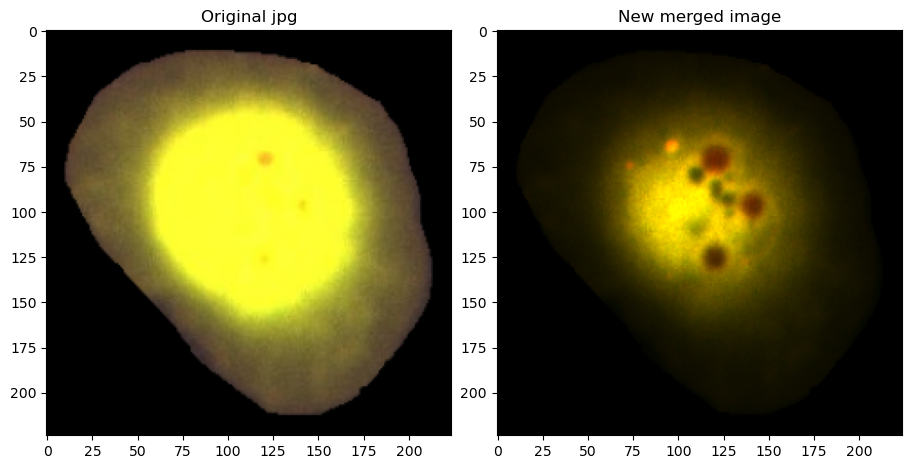

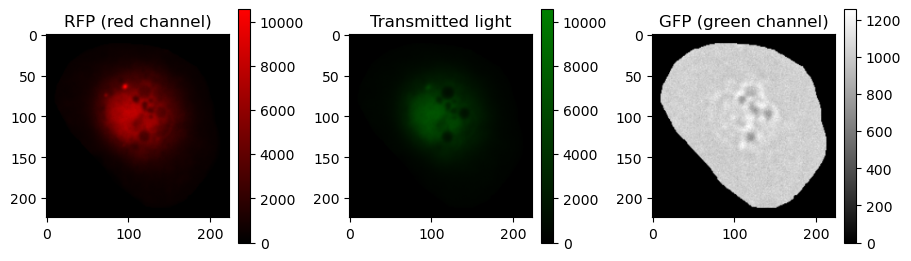

In [25]:
img = "Unidentified/Timepoint_004_220518-ST_I06_s3_134"
max_factor = 1
plot_new_merged_cell(img, 1.5)
plot_channels(img, max_factor)


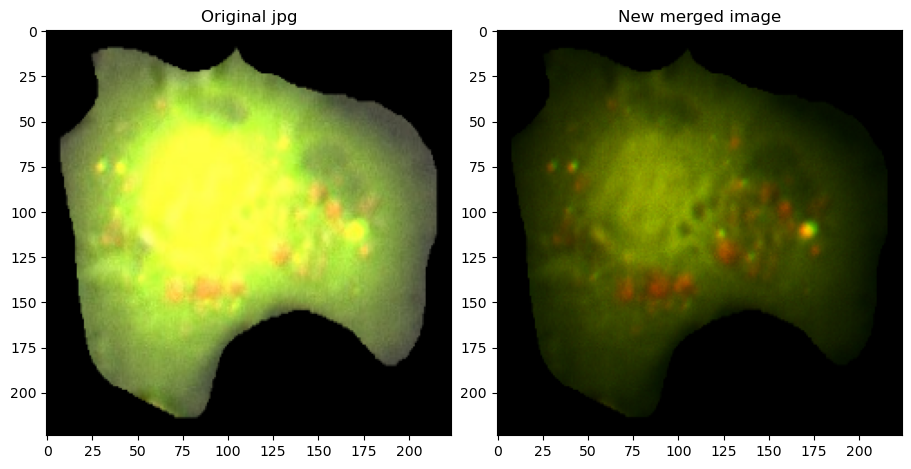

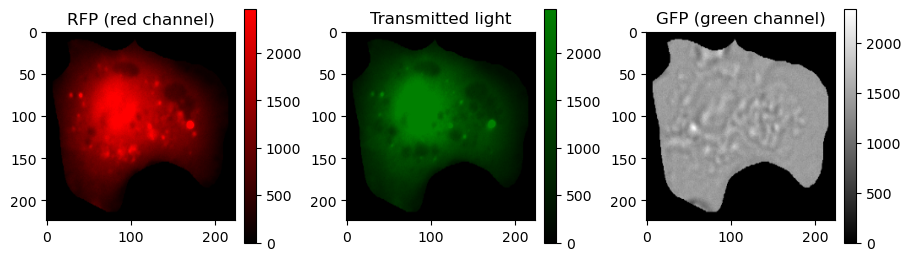

In [26]:
img = "Unidentified/Timepoint_001_220518-ST_C03_s1_166"
max_factor = 0.5
plot_new_merged_cell(img, 1)
plot_channels(img, max_factor)


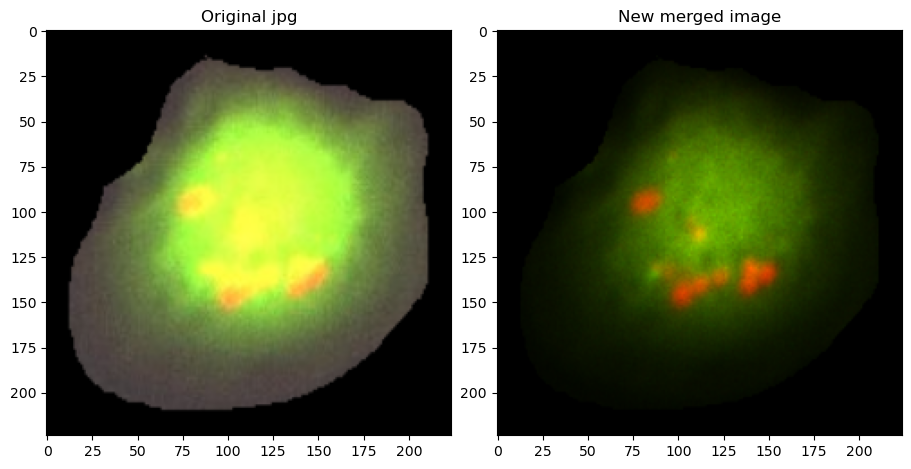

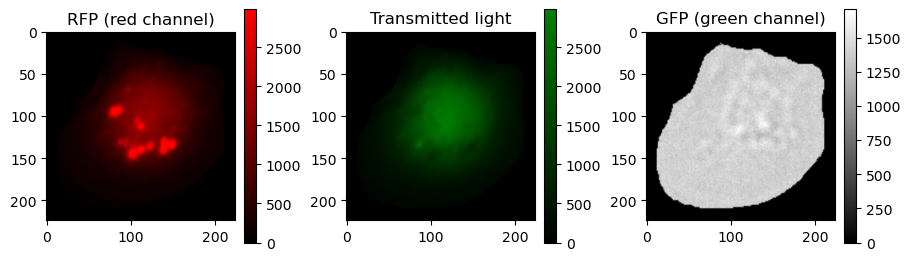

In [27]:
img = "Unidentified/Timepoint_001_220518-ST_I06_s1_140"
max_factor = 0.8
plot_new_merged_cell(img, 1)
plot_channels(img, max_factor)


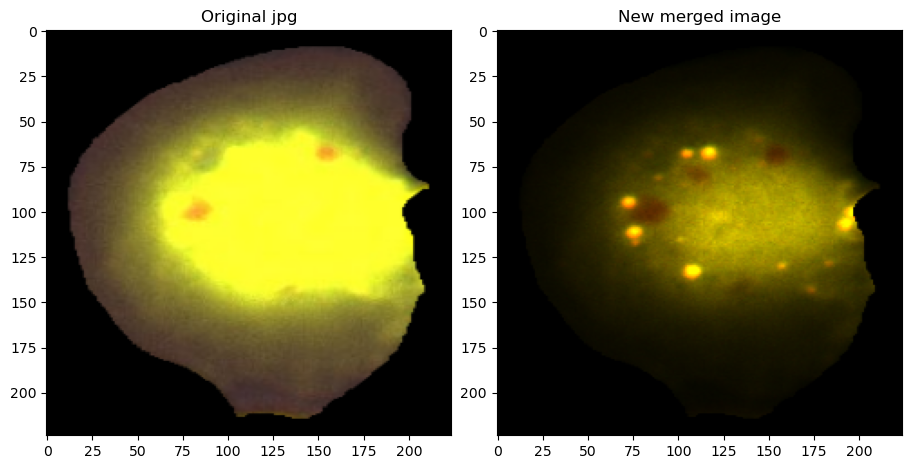

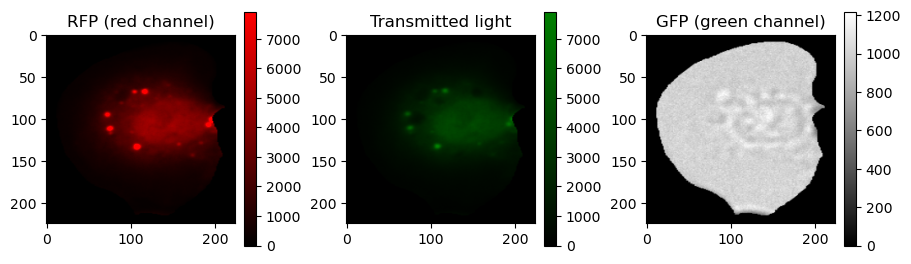

In [28]:
img = "Unidentified/Timepoint_004_220518-ST_I06_s2_141"
max_factor = 0.5
plot_new_merged_cell(img, 2.5)
plot_channels(img, max_factor)


### And now some under exposed cell
- Here there is not much to gain, there is very little green light. But how come the red is so strong? There must be some atg8 around but did it all accumulate in the spots?
- Again there is quite some green light inside of the red appearing spots, is there som un-quenched GFP around?
- Since we don't see the well background it is hard to tell if the cytosol has more green than the medium surrounding the cell. 

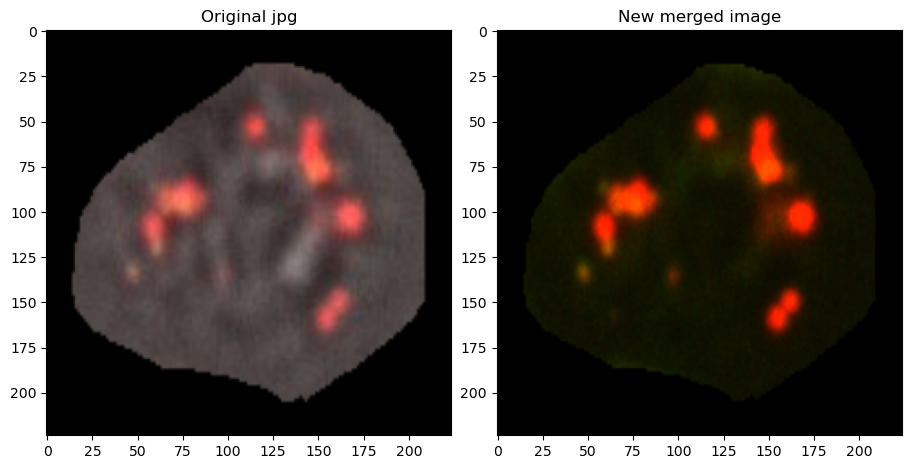

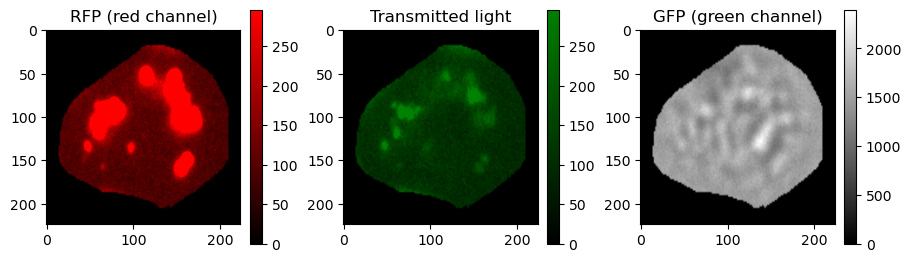

In [29]:
img = "unfed/Timepoint_001_220518-ST_I04_s1_145"
max_factor = 0.1
plot_new_merged_cell(img, 2)
plot_channels(img, max_factor)


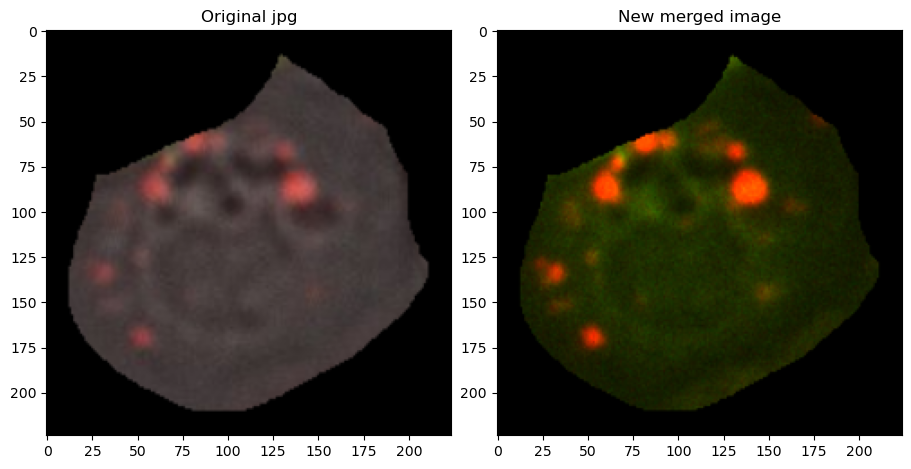

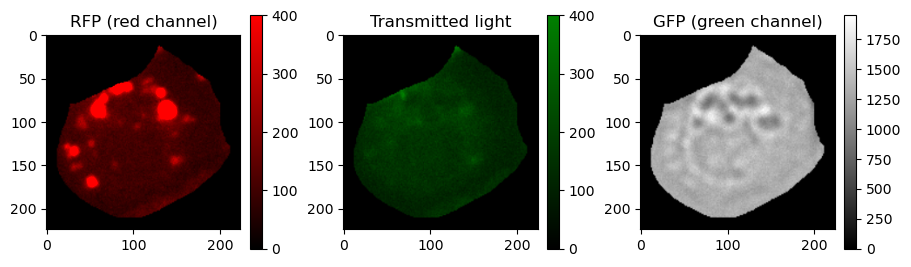

In [30]:
img = "unfed/Timepoint_001_220518-ST_I06_s2_337"
max_factor = 0.3
plot_new_merged_cell(img, 2)
plot_channels(img, max_factor)

### Some cells with odd shapes
Here are some odd looking cells. Should these be tranferred to the unknown category or are they ok? 

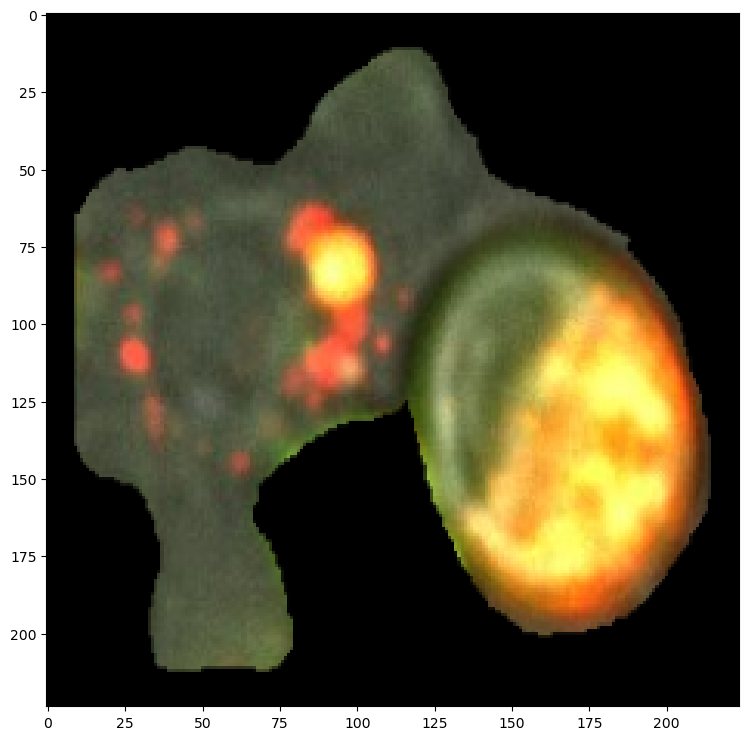

In [31]:
img = "unfed/Timepoint_002_220518-ST_C06_s3_338"
color_image = Image.open(current_dir+"/color/"+img+".png")
plt.rcParams['figure.figsize'] = [9, 9] 
plt.imshow(color_image)


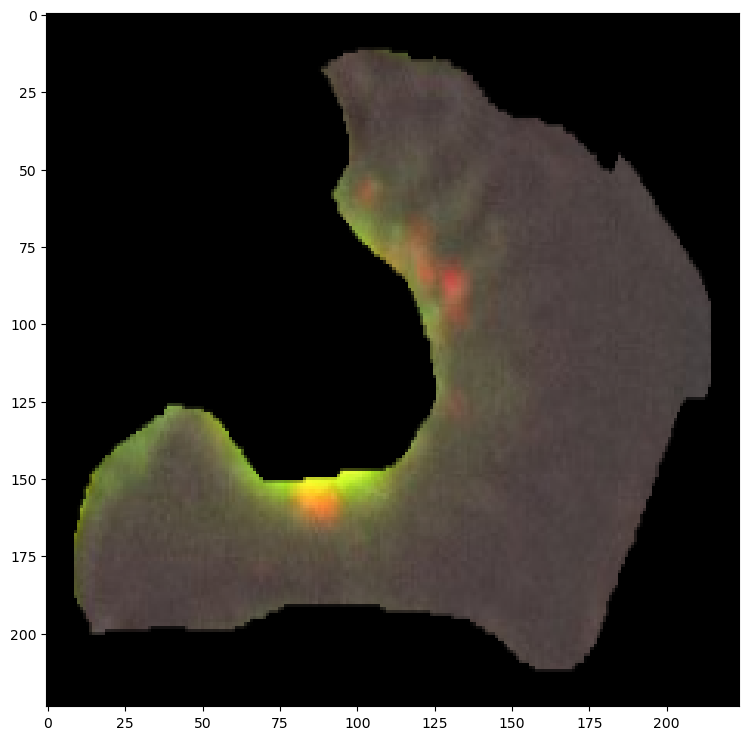

In [32]:
img = "unfed/Timepoint_001_220518-ST_I04_s3_378"
color_image = Image.open(current_dir+"/color/"+img+".png")
plt.rcParams['figure.figsize'] = [9, 9] 
plt.imshow(color_image)

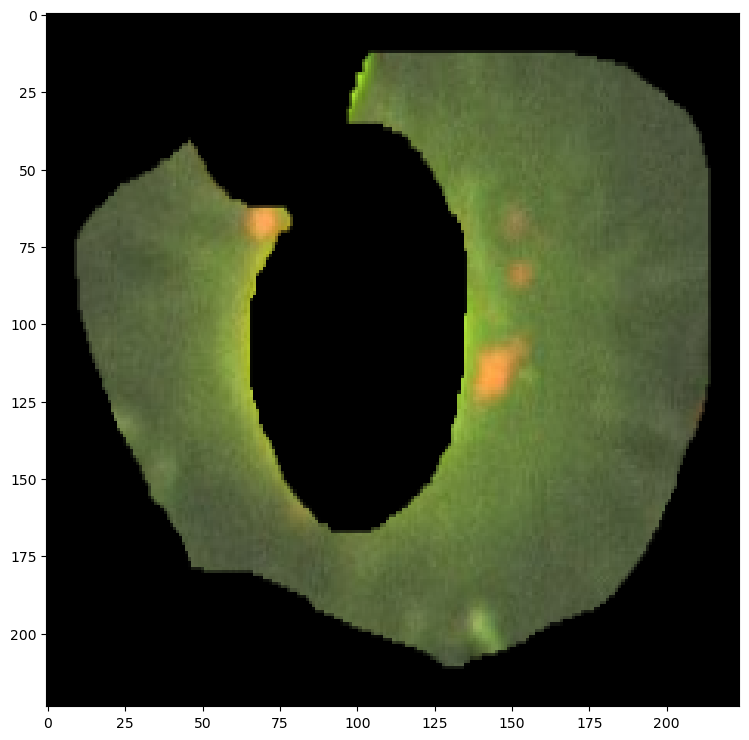

In [33]:
img = "fed/Timepoint_003_220518-ST_C05_s1_33"
color_image = Image.open(current_dir+"/color/"+img+".png")
plt.rcParams['figure.figsize'] = [9, 9] 
plt.imshow(color_image)

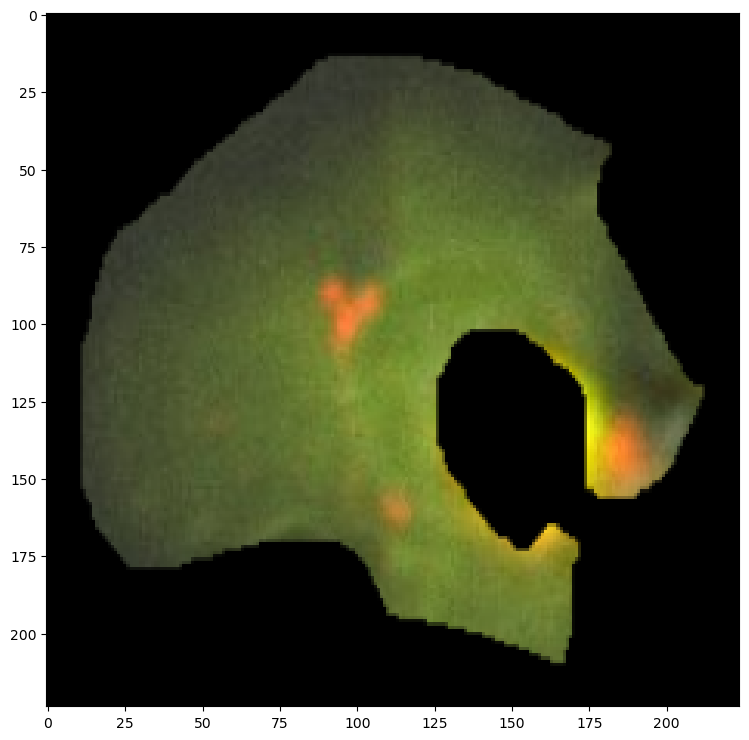

In [34]:
img = "fed/Timepoint_004_220518-ST_C03_s2_84"
color_image = Image.open(current_dir+"/color/"+img+".png")
plt.imshow(color_image)

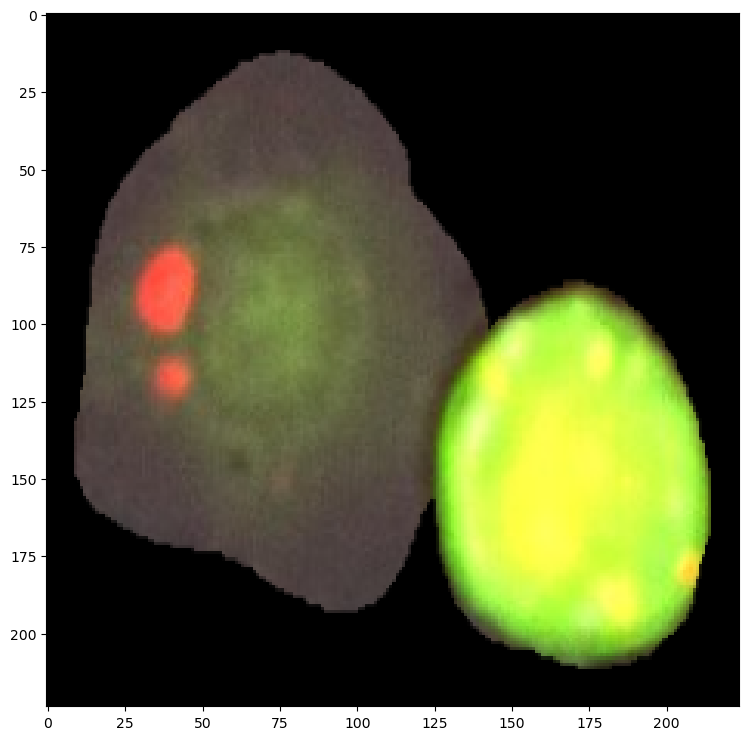

In [35]:
img = "unfed/Timepoint_001_220518-ST_I04_s3_352"
color_image = Image.open(current_dir+"/color/"+img+".png")
plt.rcParams['figure.figsize'] = [9, 9] 
plt.imshow(color_image)

### Double masks
There are 272 double masks in the data set. Some really just have an extra dot somewhere, while others have an extra full cell or a hole in the cell. For now I have taken them out of the data set but if they are interesting (for instance if we want to track cells over timepoint etc.) we could manually check some and include them back with the extra mask removed. Here are some examples:

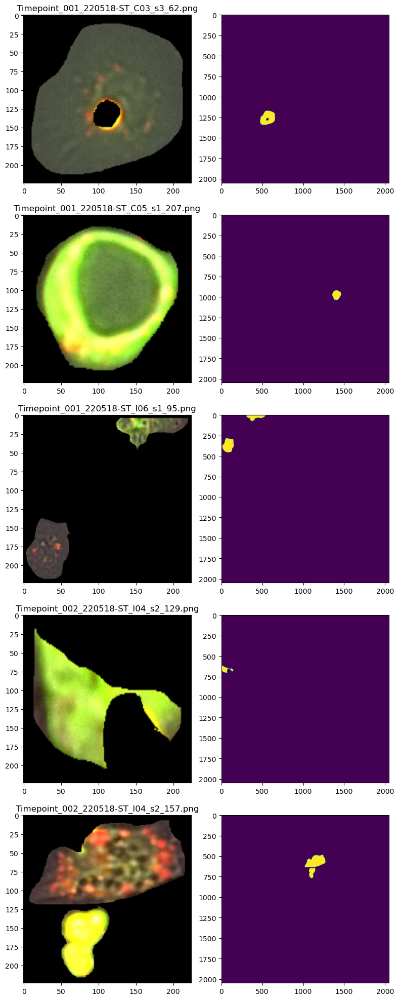

In [36]:
current_dir = os.getcwd() 
fed_dir = current_dir + "/color/double"
images = ["Timepoint_001_220518-ST_C03_s3_62.png", 
          "Timepoint_001_220518-ST_C05_s1_207.png", 
          "Timepoint_001_220518-ST_I06_s1_95.png",
         "Timepoint_002_220518-ST_I04_s2_129.png",
         "Timepoint_002_220518-ST_I04_s2_157.png"]

plot_doubles(images)

Thanks for your time :)